In [148]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, roc_auc_score, log_loss
from sklearn.ensemble import GradientBoostingClassifier

In [2]:
# pd.set_option('display.max_columns', None)

In [3]:
df = pd.read_csv("Bank Data.csv")
df.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance
0,0x160a,CUS_0xd40,September,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,2022.0,Good,809.98,35.030402,22 Years and 9 Months,No,49.574949,236.64268203272135,Low_spent_Small_value_payments,186.26670208571772
1,0x160b,CUS_0xd40,October,Aaron Maashoh,24,821-00-0265,Scientist,19114.12,1824.843333,3,...,4.0,Good,809.98,33.053114,22 Years and 10 Months,No,49.574949,21.465380264657146,High_spent_Medium_value_payments,361.44400385378196
2,0x160c,CUS_0xd40,November,Aaron Maashoh,24,821-00-0265,Scientist,19114.12,1824.843333,3,...,4.0,Good,809.98,33.811894,NaN,No,49.574949,148.23393788500925,Low_spent_Medium_value_payments,264.67544623342997
3,0x160d,CUS_0xd40,December,Aaron Maashoh,24_,821-00-0265,Scientist,19114.12,NaN,3,...,4.0,Good,809.98,32.430559,23 Years and 0 Months,No,49.574949,39.08251089460281,High_spent_Medium_value_payments,343.82687322383634
4,0x1616,CUS_0x21b1,September,Rick Rothackerj,28,004-07-5839,_______,34847.84,3037.986667,2,...,5.0,Good,605.03,25.926822,27 Years and 3 Months,No,18.816215,39.684018417945296,High_spent_Large_value_payments,485.2984336755923


In [4]:
df.isnull().sum()

ID                             0
Customer_ID                    0
Month                          0
Name                        5015
Age                            0
SSN                            0
Occupation                     0
Annual_Income                  0
Monthly_Inhand_Salary       7498
Num_Bank_Accounts              0
Num_Credit_Card                0
Interest_Rate                  0
Num_of_Loan                    0
Type_of_Loan                5704
Delay_from_due_date            0
Num_of_Delayed_Payment      3498
Changed_Credit_Limit           0
Num_Credit_Inquiries        1035
Credit_Mix                     0
Outstanding_Debt               0
Credit_Utilization_Ratio       0
Credit_History_Age          4470
Payment_of_Min_Amount          0
Total_EMI_per_month            0
Amount_invested_monthly     2271
Payment_Behaviour              0
Monthly_Balance              562
dtype: int64

In [5]:
df.drop(columns=['ID','Customer_ID','SSN','Name','Type_of_Loan','Payment_Behaviour'],inplace=True)
df.head()

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,...,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
0,September,23,Scientist,19114.12,1824.843333,3,4,3,4,3,...,11.27,2022.0,Good,809.98,35.030402,22 Years and 9 Months,No,49.574949,236.64268203272135,186.26670208571772
1,October,24,Scientist,19114.12,1824.843333,3,4,3,4,3,...,13.27,4.0,Good,809.98,33.053114,22 Years and 10 Months,No,49.574949,21.465380264657146,361.44400385378196
2,November,24,Scientist,19114.12,1824.843333,3,4,3,4,-1,...,12.27,4.0,Good,809.98,33.811894,NaN,No,49.574949,148.23393788500925,264.67544623342997
3,December,24_,Scientist,19114.12,NaN,3,4,3,4,4,...,11.27,4.0,Good,809.98,32.430559,23 Years and 0 Months,No,49.574949,39.08251089460281,343.82687322383634
4,September,28,_______,34847.84,3037.986667,2,4,6,1,3,...,5.42,5.0,Good,605.03,25.926822,27 Years and 3 Months,No,18.816215,39.684018417945296,485.2984336755923


In [6]:
df.shape

(50000, 21)

In [7]:
df.Credit_Mix.value_counts().head(10)

Standard    18379
Good        12260
_            9805
Bad          9556
Name: Credit_Mix, dtype: int64

In [8]:
# Assuming df is your DataFrame
df['Credit_Mix'].replace('_', 'neutral', inplace=True)
df['Credit_Mix'].fillna('neutral', inplace=True)


In [9]:
df.Credit_Mix.value_counts().head(10)

Standard    18379
Good        12260
neutral      9805
Bad          9556
Name: Credit_Mix, dtype: int64

In [10]:
df.isnull().sum()

Month                          0
Age                            0
Occupation                     0
Annual_Income                  0
Monthly_Inhand_Salary       7498
Num_Bank_Accounts              0
Num_Credit_Card                0
Interest_Rate                  0
Num_of_Loan                    0
Delay_from_due_date            0
Num_of_Delayed_Payment      3498
Changed_Credit_Limit           0
Num_Credit_Inquiries        1035
Credit_Mix                     0
Outstanding_Debt               0
Credit_Utilization_Ratio       0
Credit_History_Age          4470
Payment_of_Min_Amount          0
Total_EMI_per_month            0
Amount_invested_monthly     2271
Monthly_Balance              562
dtype: int64

In [12]:
# df.Delay_from_due_date.value_counts().sample(40)

In [13]:
# Convert String to Float of Credit_History_Age column also fill the null value with it's mean

def extract_age(row):
    if isinstance(row, str):
        years, months = 0, 0
        if 'Years' in row:
            years = int(row.split(' Years')[0])
        if 'Months' in row:
            months = int(row.split('and ')[1].split(' Months')[0])
        return years + months / 12
    else:
        return np.nan

df['Credit_History_Age'] = df['Credit_History_Age'].apply(extract_age)

# Fill missing values with the mean
mean_age = df['Credit_History_Age'].mean()
df['Credit_History_Age'].fillna(mean_age, inplace=True)

In [14]:
df.head(5)

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,...,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
0,September,23,Scientist,19114.12,1824.843333,3,4,3,4,3,...,11.27,2022.0,Good,809.98,35.030402,22.750000,No,49.574949,236.64268203272135,186.26670208571772
1,October,24,Scientist,19114.12,1824.843333,3,4,3,4,3,...,13.27,4.0,Good,809.98,33.053114,22.833333,No,49.574949,21.465380264657146,361.44400385378196
2,November,24,Scientist,19114.12,1824.843333,3,4,3,4,-1,...,12.27,4.0,Good,809.98,33.811894,18.937598,No,49.574949,148.23393788500925,264.67544623342997
3,December,24_,Scientist,19114.12,NaN,3,4,3,4,4,...,11.27,4.0,Good,809.98,32.430559,23.000000,No,49.574949,39.08251089460281,343.82687322383634
4,September,28,_______,34847.84,3037.986667,2,4,6,1,3,...,5.42,5.0,Good,605.03,25.926822,27.250000,No,18.816215,39.684018417945296,485.2984336755923


In [15]:
df.Payment_of_Min_Amount.value_counts()

Yes    26158
No     17849
NM      5993
Name: Payment_of_Min_Amount, dtype: int64

In [16]:
df.Occupation.value_counts()

_______          3438
Lawyer           3324
Engineer         3212
Architect        3195
Mechanic         3168
Developer        3146
Accountant       3133
Media_Manager    3130
Scientist        3104
Teacher          3103
Entrepreneur     3103
Journalist       3037
Doctor           3027
Manager          3000
Musician         2947
Writer           2933
Name: Occupation, dtype: int64

In [17]:
# import numpy as np

# Replace "_______" with NaN
df['Occupation'].replace("_______", np.nan, inplace=True)

# Get the list of occupations
occupations_list = ["Lawyer", "Engineer", "Architect", "Mechanic", "Developer", "Accountant",
                    "Media_Manager", "Scientist", "Teacher", "Entrepreneur", "Journalist",
                    "Doctor", "Manager", "Musician", "Writer"]

# Replace NaN values with random values from the list
nan_mask = df['Occupation'].isnull()
df.loc[nan_mask, 'Occupation'] = np.random.choice(occupations_list, size=nan_mask.sum())


In [19]:
df.Occupation.value_counts()

Lawyer           3579
Architect        3439
Engineer         3438
Mechanic         3412
Developer        3369
Media_Manager    3366
Accountant       3358
Scientist        3329
Entrepreneur     3323
Teacher          3317
Journalist       3261
Doctor           3246
Manager          3246
Writer           3160
Musician         3157
Name: Occupation, dtype: int64

In [20]:
df.isnull().sum()

Month                          0
Age                            0
Occupation                     0
Annual_Income                  0
Monthly_Inhand_Salary       7498
Num_Bank_Accounts              0
Num_Credit_Card                0
Interest_Rate                  0
Num_of_Loan                    0
Delay_from_due_date            0
Num_of_Delayed_Payment      3498
Changed_Credit_Limit           0
Num_Credit_Inquiries        1035
Credit_Mix                     0
Outstanding_Debt               0
Credit_Utilization_Ratio       0
Credit_History_Age             0
Payment_of_Min_Amount          0
Total_EMI_per_month            0
Amount_invested_monthly     2271
Monthly_Balance              562
dtype: int64

In [21]:
df.dtypes


Month                        object
Age                          object
Occupation                   object
Annual_Income                object
Monthly_Inhand_Salary       float64
Num_Bank_Accounts             int64
Num_Credit_Card               int64
Interest_Rate                 int64
Num_of_Loan                  object
Delay_from_due_date           int64
Num_of_Delayed_Payment       object
Changed_Credit_Limit         object
Num_Credit_Inquiries        float64
Credit_Mix                   object
Outstanding_Debt             object
Credit_Utilization_Ratio    float64
Credit_History_Age          float64
Payment_of_Min_Amount        object
Total_EMI_per_month         float64
Amount_invested_monthly      object
Monthly_Balance              object
dtype: object

Convert required string columns to int/float

In [22]:
# Assuming our DataFrame is named 'df'
columns_to_convert = ['Age', 'Annual_Income','Num_of_Loan', 'Delay_from_due_date', 'Num_of_Delayed_Payment',
                       'Changed_Credit_Limit','Outstanding_Debt', 'Amount_invested_monthly', 'Monthly_Balance']

# Convert selected columns to numeric types
df[columns_to_convert] = df[columns_to_convert].apply(pd.to_numeric, errors='coerce')

# Check the data types after conversion
print(df.dtypes)


Month                        object
Age                         float64
Occupation                   object
Annual_Income               float64
Monthly_Inhand_Salary       float64
Num_Bank_Accounts             int64
Num_Credit_Card               int64
Interest_Rate                 int64
Num_of_Loan                 float64
Delay_from_due_date           int64
Num_of_Delayed_Payment      float64
Changed_Credit_Limit        float64
Num_Credit_Inquiries        float64
Credit_Mix                   object
Outstanding_Debt            float64
Credit_Utilization_Ratio    float64
Credit_History_Age          float64
Payment_of_Min_Amount        object
Total_EMI_per_month         float64
Amount_invested_monthly     float64
Monthly_Balance             float64
dtype: object


In [23]:
df.isnull().sum()

Month                          0
Age                         2477
Occupation                     0
Annual_Income               3520
Monthly_Inhand_Salary       7498
Num_Bank_Accounts              0
Num_Credit_Card                0
Interest_Rate                  0
Num_of_Loan                 2436
Delay_from_due_date            0
Num_of_Delayed_Payment      4925
Changed_Credit_Limit        1059
Num_Credit_Inquiries        1035
Credit_Mix                     0
Outstanding_Debt             491
Credit_Utilization_Ratio       0
Credit_History_Age             0
Payment_of_Min_Amount          0
Total_EMI_per_month            0
Amount_invested_monthly     4446
Monthly_Balance              568
dtype: int64

In [24]:
# Work with Monthly_Inhand_Salary columns and fill all missing rows by it's mean

df['Monthly_Inhand_Salary'].value_counts().tail(40)

2714.053557     1
9477.328612     1
7405.809676     1
3303.945000     1
7005.635000     1
873.865417      1
8343.470000     1
6765.796667     1
6204.196083     1
1158.442083     1
8188.211724     1
3750.272500     1
2836.380833     1
8717.732500     1
7823.998705     1
12318.281290    1
2438.323333     1
1801.474167     1
1497.882500     1
926.473333      1
3312.502174     1
14241.603333    1
8437.365531     1
887.077917      1
1488.550000     1
5708.490000     1
4473.288333     1
3792.167500     1
1183.864167     1
11643.130049    1
6107.183333     1
683.253333      1
1039.349084     1
689.187083      1
1652.952966     1
12386.966240    1
5993.870000     1
6763.330000     1
7729.695181     1
2312.785000     1
Name: Monthly_Inhand_Salary, dtype: int64

In [25]:
average_monthly_salary = df['Monthly_Inhand_Salary'].mean()
df['Monthly_Inhand_Salary'].fillna(value=average_monthly_salary, inplace=True)

df.isnull().sum()

Month                          0
Age                         2477
Occupation                     0
Annual_Income               3520
Monthly_Inhand_Salary          0
Num_Bank_Accounts              0
Num_Credit_Card                0
Interest_Rate                  0
Num_of_Loan                 2436
Delay_from_due_date            0
Num_of_Delayed_Payment      4925
Changed_Credit_Limit        1059
Num_Credit_Inquiries        1035
Credit_Mix                     0
Outstanding_Debt             491
Credit_Utilization_Ratio       0
Credit_History_Age             0
Payment_of_Min_Amount          0
Total_EMI_per_month            0
Amount_invested_monthly     4446
Monthly_Balance              568
dtype: int64

In [26]:
# Age can't be negative so remove all negative values and fill it by it's mean

df['Age'].value_counts().head(40)

39.0    1493
32.0    1440
44.0    1428
22.0    1422
35.0    1414
37.0    1397
27.0    1382
20.0    1374
29.0    1368
26.0    1348
28.0    1344
30.0    1341
41.0    1338
25.0    1325
36.0    1318
24.0    1318
33.0    1280
42.0    1277
19.0    1277
38.0    1266
31.0    1265
21.0    1260
34.0    1236
23.0    1213
45.0    1208
40.0    1196
43.0    1193
46.0    1127
18.0     796
15.0     744
16.0     731
17.0     720
53.0     657
50.0     653
55.0     647
49.0     644
47.0     624
54.0     623
51.0     610
52.0     593
Name: Age, dtype: int64

In [27]:
df['Age'] = df['Age'].apply(lambda x: x if (x >= 0 and x <= 100) else np.nan)
mean_age = df['Age'].mean()
df['Age'].fillna(mean_age, inplace=True)

df.isnull().sum()

Month                          0
Age                            0
Occupation                     0
Annual_Income               3520
Monthly_Inhand_Salary          0
Num_Bank_Accounts              0
Num_Credit_Card                0
Interest_Rate                  0
Num_of_Loan                 2436
Delay_from_due_date            0
Num_of_Delayed_Payment      4925
Changed_Credit_Limit        1059
Num_Credit_Inquiries        1035
Credit_Mix                     0
Outstanding_Debt             491
Credit_Utilization_Ratio       0
Credit_History_Age             0
Payment_of_Min_Amount          0
Total_EMI_per_month            0
Amount_invested_monthly     4446
Monthly_Balance              568
dtype: int64

In [28]:
# Working with Annual_Income Column

df['Annual_Income'].value_counts().head(45)

109945.320    8
17816.750     8
9141.630      8
36585.120     8
72524.200     8
95596.350     8
22434.160     8
33029.660     7
20867.670     7
40341.160     7
17273.830     6
32543.380     5
43790.400     4
28431.060     4
43268.790     4
108638.760    4
32198.230     4
138920.840    4
56784.540     4
7577.175      4
50807.440     4
13864.835     4
145932.040    4
19183.530     4
68948.320     4
24778.800     4
66189.240     4
20560.130     4
14226.810     4
83552.120     4
37353.580     4
151437.080    4
13000.735     4
14888.915     4
100465.140    4
16697.830     4
20090.020     4
94256.480     4
7295.715      4
18500.540     4
35317.810     4
25703.340     4
70973.320     4
121233.510    4
71518.920     4
Name: Annual_Income, dtype: int64

In [29]:
# Calculate the mean of the 'Annual_Income' column
mean_annual_income = df['Annual_Income'].mean()

# Fill missing values with the mean
df['Annual_Income'].fillna(mean_annual_income, inplace=True)
df.isnull().sum()

Month                          0
Age                            0
Occupation                     0
Annual_Income                  0
Monthly_Inhand_Salary          0
Num_Bank_Accounts              0
Num_Credit_Card                0
Interest_Rate                  0
Num_of_Loan                 2436
Delay_from_due_date            0
Num_of_Delayed_Payment      4925
Changed_Credit_Limit        1059
Num_Credit_Inquiries        1035
Credit_Mix                     0
Outstanding_Debt             491
Credit_Utilization_Ratio       0
Credit_History_Age             0
Payment_of_Min_Amount          0
Total_EMI_per_month            0
Amount_invested_monthly     4446
Monthly_Balance              568
dtype: int64

In [30]:
average_monthly_salary = df['Monthly_Inhand_Salary'].mean()
df['Monthly_Inhand_Salary'].fillna(value=average_monthly_salary, inplace=True)

df.isnull().sum()

Month                          0
Age                            0
Occupation                     0
Annual_Income                  0
Monthly_Inhand_Salary          0
Num_Bank_Accounts              0
Num_Credit_Card                0
Interest_Rate                  0
Num_of_Loan                 2436
Delay_from_due_date            0
Num_of_Delayed_Payment      4925
Changed_Credit_Limit        1059
Num_Credit_Inquiries        1035
Credit_Mix                     0
Outstanding_Debt             491
Credit_Utilization_Ratio       0
Credit_History_Age             0
Payment_of_Min_Amount          0
Total_EMI_per_month            0
Amount_invested_monthly     4446
Monthly_Balance              568
dtype: int64

In [31]:
# Working with Number_of_Delayed_payment columns and fill it's missing rows with it's random vlaues those values are has most 
# frequently in this columns

df['Num_of_Delayed_Payment'].value_counts().head(50)

 19.0      2622
 15.0      2594
 18.0      2570
 16.0      2548
 17.0      2545
 10.0      2517
 12.0      2483
 11.0      2440
 20.0      2422
 9.0       2365
 8.0       2352
 14.0      2007
 13.0      2000
 21.0      1315
 7.0       1140
 22.0      1116
 6.0       1076
 5.0       1036
 23.0      1011
 3.0        939
 4.0        887
 2.0        872
 24.0       836
 1.0        814
 25.0       813
 0.0        784
 26.0       147
-1.0        123
 27.0       104
-2.0        103
 28.0        64
-3.0         49
 2606.0       3
 538.0        2
 265.0        2
 549.0        2
 688.0        2
 2583.0       2
 3064.0       2
 1377.0       2
 2649.0       2
 762.0        2
 2608.0       2
 861.0        2
 3425.0       2
 2595.0       2
 3666.0       1
 1718.0       1
 1344.0       1
 4206.0       1
Name: Num_of_Delayed_Payment, dtype: int64

In [32]:
# Create a list of the top most common values
top_values = [19, 15, 18, 16, 17, 10, 11, 12, 20, 9, 8, 14, 13, 21, 7, 22, 6, 5, 23, 3, 4, 2, 24, 1, 25, 0]

# Replace negative numbers with NaN
df['Num_of_Delayed_Payment'] = df['Num_of_Delayed_Payment'].apply(lambda x: x if x >= 0 else np.nan)

# Replace missing values with the top values
missing_indices = df['Num_of_Delayed_Payment'].isnull()
df.loc[missing_indices, 'Num_of_Delayed_Payment'] = np.random.choice(top_values, size=missing_indices.sum())

In [33]:
# Working with Num_of_Loan columns and fill it's missing rows with it's random vlaues those values are has most 
# frequently in this columns

df.isnull().sum()

Month                          0
Age                            0
Occupation                     0
Annual_Income                  0
Monthly_Inhand_Salary          0
Num_Bank_Accounts              0
Num_Credit_Card                0
Interest_Rate                  0
Num_of_Loan                 2436
Delay_from_due_date            0
Num_of_Delayed_Payment         0
Changed_Credit_Limit        1059
Num_Credit_Inquiries        1035
Credit_Mix                     0
Outstanding_Debt             491
Credit_Utilization_Ratio       0
Credit_History_Age             0
Payment_of_Min_Amount          0
Total_EMI_per_month            0
Amount_invested_monthly     4446
Monthly_Balance              568
dtype: int64

In [34]:
df.Num_of_Loan.value_counts().head(10)

 2.0      7173
 3.0      7114
 4.0      6982
 0.0      5163
 1.0      5029
 6.0      3707
 7.0      3483
 5.0      3437
-100.0    1974
 9.0      1746
Name: Num_of_Loan, dtype: int64

In [35]:
# Replace negative numbers with NaN
df['Num_of_Loan'] = df['Num_of_Loan'].apply(lambda x: x if x >= 0 else np.nan)

# Create a list of the top most common values
top_values = [2.0, 3.0, 4.0, 0.0, 1.0, 6.0, 7.0, 5.0, 9.0, 8.0]

# Replace missing values with the top values
missing_indices = df['Num_of_Loan'].isnull()
df.loc[missing_indices, 'Num_of_Loan'] = np.random.choice(top_values, size=missing_indices.sum())

df.isnull().sum()

Month                          0
Age                            0
Occupation                     0
Annual_Income                  0
Monthly_Inhand_Salary          0
Num_Bank_Accounts              0
Num_Credit_Card                0
Interest_Rate                  0
Num_of_Loan                    0
Delay_from_due_date            0
Num_of_Delayed_Payment         0
Changed_Credit_Limit        1059
Num_Credit_Inquiries        1035
Credit_Mix                     0
Outstanding_Debt             491
Credit_Utilization_Ratio       0
Credit_History_Age             0
Payment_of_Min_Amount          0
Total_EMI_per_month            0
Amount_invested_monthly     4446
Monthly_Balance              568
dtype: int64

In [36]:
#  working with Changed_Credit_Limit column

negative_changed_limit = df[df['Changed_Credit_Limit'] < 0]
print(negative_changed_limit['Changed_Credit_Limit'].value_counts().head(10))


-4.08    5
-0.79    5
-2.50    5
-2.03    5
-1.41    5
-0.60    4
-1.46    4
-3.22    4
-0.67    4
-0.99    4
Name: Changed_Credit_Limit, dtype: int64


In a financial context, a negative value for "Changed_Credit_Limit" might represent a reduction or decrease in the credit limit. In some cases, financial institutions or credit card companies may decrease a person's credit limit based on various factors such as changes in creditworthiness, missed payments, or other risk-related considerations.

In [37]:
mean_credit_limit = df['Changed_Credit_Limit'].mean()

# Fill missing values with the mean
df['Changed_Credit_Limit'].fillna(mean_credit_limit, inplace=True)
df.isnull().sum()

Month                          0
Age                            0
Occupation                     0
Annual_Income                  0
Monthly_Inhand_Salary          0
Num_Bank_Accounts              0
Num_Credit_Card                0
Interest_Rate                  0
Num_of_Loan                    0
Delay_from_due_date            0
Num_of_Delayed_Payment         0
Changed_Credit_Limit           0
Num_Credit_Inquiries        1035
Credit_Mix                     0
Outstanding_Debt             491
Credit_Utilization_Ratio       0
Credit_History_Age             0
Payment_of_Min_Amount          0
Total_EMI_per_month            0
Amount_invested_monthly     4446
Monthly_Balance              568
dtype: int64

In [38]:
# Working with Num_Credit_Inquiries column

df['Num_Credit_Inquiries'].value_counts().head(30)

5.0       4709
4.0       4402
6.0       4375
7.0       4295
8.0       3922
9.0       3523
3.0       3466
11.0      2996
10.0      2982
12.0      2585
2.0       2454
13.0      2065
1.0       1747
14.0      1394
0.0       1102
15.0      1063
16.0       651
17.0       388
2326.0       3
2338.0       3
1431.0       3
1823.0       3
2019.0       3
1856.0       3
1785.0       3
2179.0       2
1984.0       2
1902.0       2
824.0        2
1990.0       2
Name: Num_Credit_Inquiries, dtype: int64

In [39]:
# Set the number of rows to fill
num_rows_to_fill = 1035

# Generate random values between 1 and 20
random_values = np.random.randint(1, 21, size=num_rows_to_fill)

# Find the indices of missing values in 'Num_Credit_Inquiries'
missing_indices = df['Num_Credit_Inquiries'].isnull()

# Replace missing values with random values
df.loc[missing_indices, 'Num_Credit_Inquiries'] = random_values

In [40]:
df.isnull().sum()

Month                          0
Age                            0
Occupation                     0
Annual_Income                  0
Monthly_Inhand_Salary          0
Num_Bank_Accounts              0
Num_Credit_Card                0
Interest_Rate                  0
Num_of_Loan                    0
Delay_from_due_date            0
Num_of_Delayed_Payment         0
Changed_Credit_Limit           0
Num_Credit_Inquiries           0
Credit_Mix                     0
Outstanding_Debt             491
Credit_Utilization_Ratio       0
Credit_History_Age             0
Payment_of_Min_Amount          0
Total_EMI_per_month            0
Amount_invested_monthly     4446
Monthly_Balance              568
dtype: int64

In [41]:
# Working with Amount_invested_monthly column

df['Amount_invested_monthly'].value_counts().tail(30)

257.173563    1
352.895283    1
188.628242    1
262.440115    1
168.210066    1
77.923151     1
92.694694     1
49.231406     1
40.952555     1
74.746469     1
735.175586    1
130.785144    1
390.765481    1
192.343397    1
409.051633    1
610.385627    1
687.238659    1
793.371509    1
189.034767    1
54.865397     1
41.622649     1
247.478334    1
183.951614    1
147.419348    1
592.143969    1
197.217131    1
366.231484    1
34.899406     1
256.908305    1
220.457878    1
Name: Amount_invested_monthly, dtype: int64

In [42]:
# Convert 'Amount_invested_monthly' to numeric, handling errors with 'coerce'
#df['Amount_invested_monthly'] = pd.to_numeric(df['Amount_invested_monthly'], errors='coerce')

# Calculate the mean after converting to numeric
mean_amount_invested = df['Amount_invested_monthly'].mean()

# Fill missing values with the mean
df['Amount_invested_monthly'].fillna(value=mean_amount_invested, inplace=True)


In [43]:
df.isnull().sum()

Month                         0
Age                           0
Occupation                    0
Annual_Income                 0
Monthly_Inhand_Salary         0
Num_Bank_Accounts             0
Num_Credit_Card               0
Interest_Rate                 0
Num_of_Loan                   0
Delay_from_due_date           0
Num_of_Delayed_Payment        0
Changed_Credit_Limit          0
Num_Credit_Inquiries          0
Credit_Mix                    0
Outstanding_Debt            491
Credit_Utilization_Ratio      0
Credit_History_Age            0
Payment_of_Min_Amount         0
Total_EMI_per_month           0
Amount_invested_monthly       0
Monthly_Balance             568
dtype: int64

In [44]:
# Working with Outstanding_Debt column

df['Outstanding_Debt'].value_counts().head(23)

1360.45    12
460.46     12
1109.03    12
1151.70    12
1170.58     8
2196.59     8
1466.97     8
1286.07     8
2538.06     8
255.82      8
2536.84     8
852.74      8
380.09      8
557.78      8
630.24      8
434.36      8
1334.09     8
1004.26     8
146.68      8
248.84      8
157.62      8
795.69      8
713.33      8
Name: Outstanding_Debt, dtype: int64

In [45]:
# Calculate the mean of 'Outstanding_Debt' excluding negative values
mean_outstanding_debt = df[df['Outstanding_Debt'] >= 0]['Outstanding_Debt'].mean()

# Replace negative values with NaN
#df.loc[df['Outstanding_Debt'] < 0, 'Outstanding_Debt'] = np.nan

# Fill missing values with the mean
df['Outstanding_Debt'].fillna(mean_outstanding_debt, inplace=True)

df.isnull().sum()

Month                         0
Age                           0
Occupation                    0
Annual_Income                 0
Monthly_Inhand_Salary         0
Num_Bank_Accounts             0
Num_Credit_Card               0
Interest_Rate                 0
Num_of_Loan                   0
Delay_from_due_date           0
Num_of_Delayed_Payment        0
Changed_Credit_Limit          0
Num_Credit_Inquiries          0
Credit_Mix                    0
Outstanding_Debt              0
Credit_Utilization_Ratio      0
Credit_History_Age            0
Payment_of_Min_Amount         0
Total_EMI_per_month           0
Amount_invested_monthly       0
Monthly_Balance             568
dtype: int64

In [46]:
# Working with Monthly_Balance column

df['Monthly_Balance'].value_counts().sample(30)

237.327150    1
405.028229    1
332.403757    1
632.549054    1
245.600435    1
230.553900    1
309.628968    1
309.790968    1
305.301458    1
334.686007    1
389.674363    1
220.079875    1
506.364484    1
437.032440    1
213.468564    1
298.337685    1
257.673868    1
179.107957    1
273.313354    1
630.292122    1
546.881574    1
367.063904    1
341.639729    1
458.952946    1
393.914617    1
815.995889    1
969.260983    1
230.062032    1
244.324730    1
405.124755    1
Name: Monthly_Balance, dtype: int64

In [47]:
mean_monthly_balance = df['Monthly_Balance'].mean()
mean_monthly_balance

403.0662568630411

In [48]:
df['Monthly_Balance'].fillna(value=mean_monthly_balance, inplace=True)
df.isnull().sum()

Month                       0
Age                         0
Occupation                  0
Annual_Income               0
Monthly_Inhand_Salary       0
Num_Bank_Accounts           0
Num_Credit_Card             0
Interest_Rate               0
Num_of_Loan                 0
Delay_from_due_date         0
Num_of_Delayed_Payment      0
Changed_Credit_Limit        0
Num_Credit_Inquiries        0
Credit_Mix                  0
Outstanding_Debt            0
Credit_Utilization_Ratio    0
Credit_History_Age          0
Payment_of_Min_Amount       0
Total_EMI_per_month         0
Amount_invested_monthly     0
Monthly_Balance             0
dtype: int64

In [49]:
df.shape

(50000, 21)

I've made a new dataset that doesn't have any missing values. This helps me get consistent results without the randomness from before. Having this stable dataset ensures my findings are dependable and not influenced by chance variations.

In [50]:
df.to_csv('new_data.csv', index=False)

In [51]:
df = pd.read_csv('new_data.csv')
df.sample(20)

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,...,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
46974,November,33.0,Engineer,33652.170,2602.347500,2,5,8,1447.0,10,...,4.07,2.0,Good,306.530000,27.479634,16.500000,No,18.995377,26.688475,454.550898
13479,December,26.0,Accountant,104616.900,8481.075000,7,6,14,4.0,19,...,1.59,7.0,Standard,1417.840000,30.633768,18.666667,NM,334.098344,299.075520,494.933637
16306,November,27.0,Journalist,19441.410,1386.117500,9,8,31,2.0,39,...,3.43,13.0,Bad,1425.488588,27.547622,17.083333,Yes,22.390315,54.639913,321.581523
10486,November,39.0,Teacher,91111.980,7535.665000,6,3,16,6.0,23,...,14.91,7.0,Standard,823.660000,40.750249,11.500000,Yes,421.378906,192.362289,379.825305
33120,September,46.0,Lawyer,55120.880,4465.406667,5,7,5,4.0,20,...,1.82,11.0,neutral,1045.890000,39.533846,17.000000,Yes,103.281131,100.097465,483.162070
2896,September,35.0,Accountant,9597.790,955.815833,6,5,6,3.0,25,...,11.42,6.0,Standard,289.100000,35.747285,29.416667,Yes,66050.000000,49.975832,312.488265
24972,September,47.0,Writer,31029.870,2856.822500,1,4,11,2.0,-2,...,-3.39,3.0,Good,1347.050000,37.005215,16.333333,No,34.949220,224.264269,296.468761
26371,December,35.0,Teacher,17200.970,1115.766348,8,9,27,4.0,22,...,11.30,10.0,Standard,1513.270000,23.505587,14.083333,Yes,118.161634,141.125352,218.902249
36232,September,40.0,Teacher,14482.500,1363.875000,7,7,413,1024.0,27,...,9.27,12.0,Standard,1856.220000,31.061893,19.333333,Yes,27.219133,94.680083,304.488284
14422,November,33.0,Musician,73517.540,6412.461667,1305,7,7,2.0,13,...,6.02,5.0,Standard,1187.380000,28.431128,30.166667,Yes,61.463426,173.409133,656.373608


**EDA & Preprocessing**

In [52]:
# Display data types of each column
data_types = df.dtypes
print(data_types)

# Identify categorical columns
categorical_columns = df.select_dtypes(include=['object']).columns
print("Categorical Columns:", categorical_columns)


Month                        object
Age                         float64
Occupation                   object
Annual_Income               float64
Monthly_Inhand_Salary       float64
Num_Bank_Accounts             int64
Num_Credit_Card               int64
Interest_Rate                 int64
Num_of_Loan                 float64
Delay_from_due_date           int64
Num_of_Delayed_Payment      float64
Changed_Credit_Limit        float64
Num_Credit_Inquiries        float64
Credit_Mix                   object
Outstanding_Debt            float64
Credit_Utilization_Ratio    float64
Credit_History_Age          float64
Payment_of_Min_Amount        object
Total_EMI_per_month         float64
Amount_invested_monthly     float64
Monthly_Balance             float64
dtype: object
Categorical Columns: Index(['Month', 'Occupation', 'Credit_Mix', 'Payment_of_Min_Amount'], dtype='object')


***Target Variable*** is 'Credit_Mix'

***Ordinal Variables:***
 'Payment_of_Min_Amount' is ordinal variable. Since It has a meaningful order, we can use ordinal encoding.

***Nominal Variables:***
 'Month', 'Occupation', 'Payment_Behaviour' are nominal variables. For these, we can use one-hot encoding.




In [53]:
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder

# Define columns for ordinal encoding
ordinal_columns = ['Payment_of_Min_Amount']
ordinal_encoder = OrdinalEncoder()
df[ordinal_columns] = ordinal_encoder.fit_transform(df[ordinal_columns])
df.sample(10)


,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,...,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
15140,September,29.0,Manager,69753.120000,5521.760000,6,10,27,2.0,22,...,7.92,7.0,Bad,2487.17,35.476765,14.416667,2.0,94.172784,379.192712,368.810503
33642,November,30.0,Lawyer,8393.960000,780.496667,5,5,32,2.0,14,...,18.84,12.0,Standard,1402.78,33.878064,14.666667,2.0,8.025108,47.666259,302.358300
301,October,16.0,Teacher,43241.490000,3282.269196,1444,7,30,6.0,36,...,11.47,10.0,Bad,2174.16,33.877017,12.916667,2.0,460.427267,59.006264,386.800523
18508,September,22.0,Media_Manager,19280.730000,4182.004291,5,9,32,2.0,20,...,10.67,10.0,Standard,2412.06,33.741097,10.000000,2.0,17.677036,182.510938,276.384777
8078,November,25.0,Doctor,165116.921762,5766.491667,4,6,14,4.0,19,...,9.81,8.0,Standard,375.97,25.489232,22.250000,0.0,218.560088,206.733226,401.355852
15345,October,24.0,Doctor,121223.960000,9864.996667,5,7,3,0.0,5,...,3.36,2.0,neutral,1338.42,37.664002,19.666667,1.0,0.000000,194.835617,899.517961
21818,November,44.0,Media_Manager,38377.920000,3241.160000,4,5,5,0.0,9,...,10.54,1.0,Good,565.28,35.168509,32.083333,1.0,0.000000,273.138745,320.977255
9890,November,50.0,Scientist,15305.230000,942.642583,8,5,3,4.0,7,...,10.57,0.0,neutral,1400.42,31.124189,31.666667,1.0,189.944873,50.618903,292.773058
42978,November,27.0,Teacher,55554.690000,4182.004291,11,9,34,7.0,37,...,21.76,14.0,neutral,4974.31,33.036939,1.666667,0.0,228.116758,158.446075,328.392917
44583,December,38.0,Lawyer,140947.800000,11496.650000,5,7,5,2.0,9,...,11.08,9.0,Standard,1348.57,38.685441,19.750000,2.0,224.213818,859.205584,346.245598


In [54]:
df['Month'].value_counts()

September    12500
October      12500
November     12500
December     12500
Name: Month, dtype: int64

<Axes: >

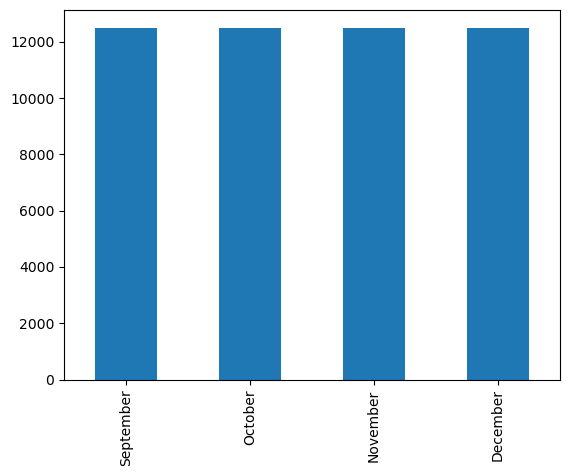

In [55]:
df['Month'].value_counts().plot(kind='bar')

In [56]:
df['Occupation'].value_counts()

Lawyer           3579
Architect        3439
Engineer         3438
Mechanic         3412
Developer        3369
Media_Manager    3366
Accountant       3358
Scientist        3329
Entrepreneur     3323
Teacher          3317
Journalist       3261
Doctor           3246
Manager          3246
Writer           3160
Musician         3157
Name: Occupation, dtype: int64

<Axes: >

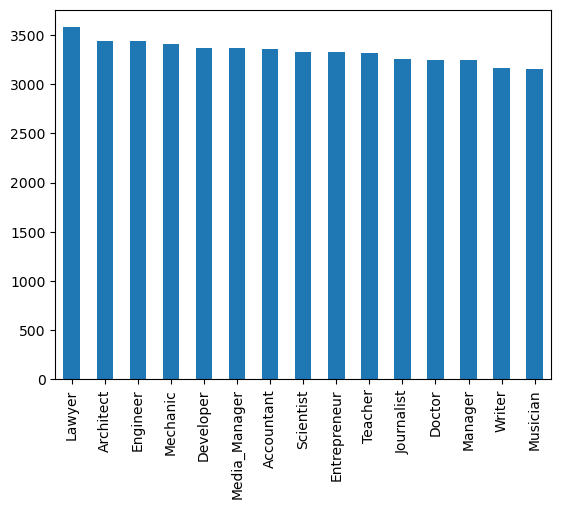

In [57]:
df['Occupation'].value_counts().plot(kind='bar')

# **Check Outliers**

**apply Z-score for:** Normal Distribution

**apply Interquartile-rules for:** Skew Distribution

**apply Percentile-base(Winsorizing) approche for:** Others Distribution

**using domain knowledge apply:** Box-Cox Transformation and Robust Scaling and log-transformations

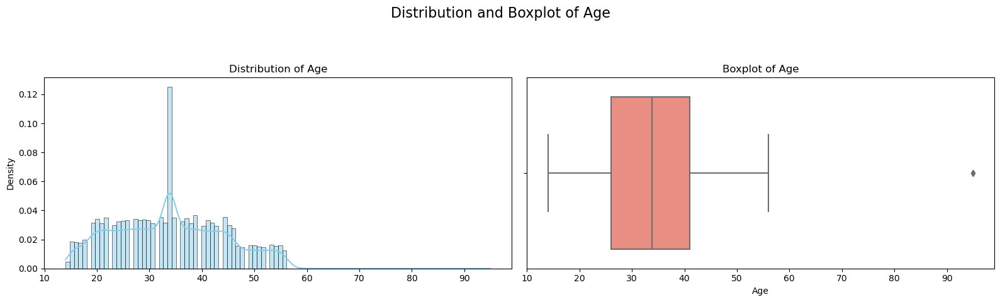

In [58]:
# Visualize 'Age'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
fig.suptitle('Distribution and Boxplot of Age', fontsize=16)
sns.histplot(df['Age'], ax=axes[0], kde=True, color='skyblue', stat="density", common_norm=False)
axes[0].set_title('Distribution of Age')
axes[0].set_xlabel("")
sns.boxplot(x=df['Age'], ax=axes[1], color='salmon')
axes[1].set_title('Boxplot of Age')
plt.tight_layout(rect=[0, 0.03, 1, 0.9])
plt.show()


**Removing outliers from Age column**

In [59]:
upper_limit = df['Age'].mean() + 3 * df['Age'].std()
lower_limit = df['Age'].mean() - 3 * df['Age'].std()

#apply z-score

df['Age'] = np.where(
   df.Age > upper_limit,
   upper_limit,
   np.where(
       df.Age < lower_limit,
       lower_limit,
       df.Age
   )
)

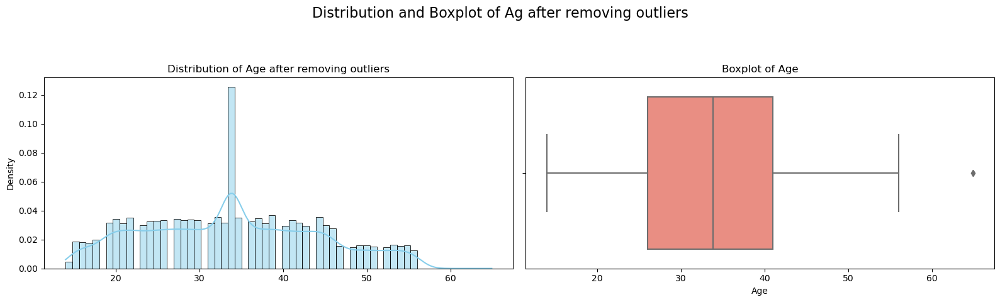

In [60]:
# Visualize 'Age'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
fig.suptitle('Distribution and Boxplot of Ag after removing outliers', fontsize=16)
sns.histplot(df['Age'], ax=axes[0], kde=True, color='skyblue', stat="density", common_norm=False)
axes[0].set_title('Distribution of Age after removing outliers')
axes[0].set_xlabel("")
sns.boxplot(x=df['Age'], ax=axes[1], color='salmon')
axes[1].set_title('Boxplot of Age')
plt.tight_layout(rect=[0, 0.03, 1, 0.9])
plt.show()


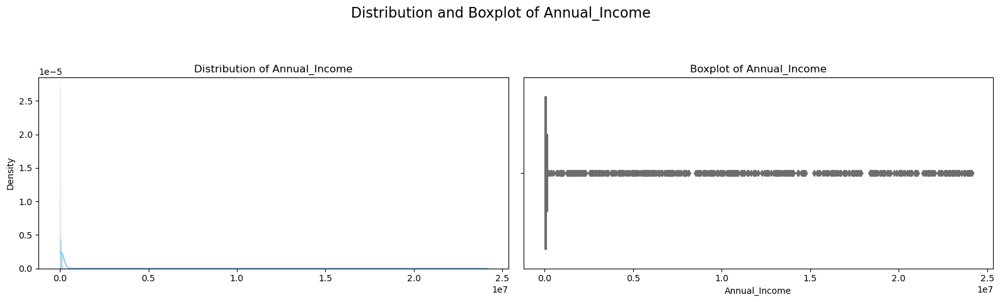

In [61]:
# Visualize 'Annual_Income'
pd.set_option('display.float_format', lambda x: '%.3f' % x)
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
fig.suptitle('Distribution and Boxplot of Annual_Income', fontsize=16)
sns.histplot(df['Annual_Income'], ax=axes[0], kde=True, color='skyblue', stat="density", common_norm=False)
axes[0].set_title('Distribution of Annual_Income')
axes[0].set_xlabel("")
sns.boxplot(x=df['Annual_Income'], ax=axes[1], color='salmon')
axes[1].set_title('Boxplot of Annual_Income')
plt.tight_layout(rect=[0, 0.03, 1, 0.9])
plt.show()


**Removing Outliers from Annual Income column**

In [62]:
upper_limit = df.Annual_Income.quantile(0.99)
lower_limit = df.Annual_Income.quantile(0.01)

#apply percentile

df['Annual_Income'] = np.where(
        df.Annual_Income >= upper_limit,
        upper_limit,
        np.where(df.Annual_Income <= lower_limit,
        lower_limit,
        df.Annual_Income)
        )

In [63]:
df['Annual_Income'] = np.log1p(df['Annual_Income']) #apply log-transformations

In [64]:
df.Annual_Income.describe()

count   50000.000
mean       10.655
std         0.858
min         8.933
25%         9.907
50%        10.622
75%        11.333
max        12.096
Name: Annual_Income, dtype: float64

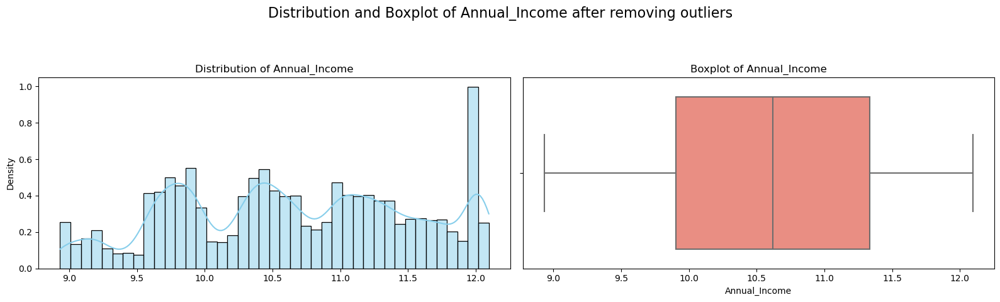

In [65]:
# Visualize 'Annual_Income'
pd.set_option('display.float_format', lambda x: '%.3f' % x)
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
fig.suptitle('Distribution and Boxplot of Annual_Income after removing outliers', fontsize=16)
sns.histplot(df['Annual_Income'], ax=axes[0], kde=True, color='skyblue', stat="density", common_norm=False)
axes[0].set_title('Distribution of Annual_Income')
axes[0].set_xlabel("")
sns.boxplot(x=df['Annual_Income'], ax=axes[1], color='salmon')
axes[1].set_title('Boxplot of Annual_Income')
plt.tight_layout(rect=[0, 0.03, 1, 0.9])
plt.show()


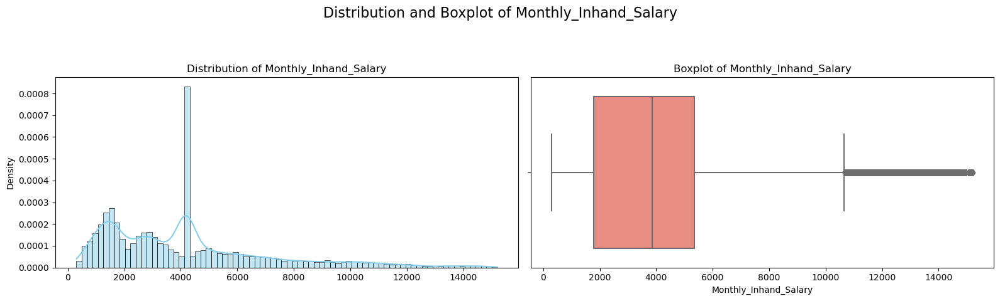

In [66]:
# Visualize 'Monthly_Inhand_Salary'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
fig.suptitle('Distribution and Boxplot of Monthly_Inhand_Salary', fontsize=16)
sns.histplot(df['Monthly_Inhand_Salary'], ax=axes[0], kde=True, color='skyblue', stat="density", common_norm=False)
axes[0].set_title('Distribution of Monthly_Inhand_Salary')
axes[0].set_xlabel("")
sns.boxplot(x=df['Monthly_Inhand_Salary'], ax=axes[1], color='salmon')
axes[1].set_title('Boxplot of Monthly_Inhand_Salary')
plt.tight_layout(rect=[0, 0.03, 1, 0.9])
plt.show()


**Removing outliers from Monthly_Inhand_Salary using Interquadile**

In [67]:
percentile25 = df.Monthly_Inhand_Salary.quantile(0.25)
percentile75 = df.Monthly_Inhand_Salary.quantile(0.75)

#apply Interquartile

iqr = percentile75 - percentile25

upper_limit = percentile75 + 1.5 * iqr
lower_limit = percentile25 - 1.5 * iqr

df['Monthly_Inhand_Salary'] = np.where(
    df.Monthly_Inhand_Salary > upper_limit,
    upper_limit,
    np.where(
        df.Monthly_Inhand_Salary < lower_limit,
        lower_limit,
        df.Monthly_Inhand_Salary
    )
)

In [68]:
df.Monthly_Inhand_Salary.describe()

count   50000.000
mean     4107.302
std      2718.816
min       303.645
25%      1794.304
50%      3848.682
75%      5338.968
max     10655.963
Name: Monthly_Inhand_Salary, dtype: float64

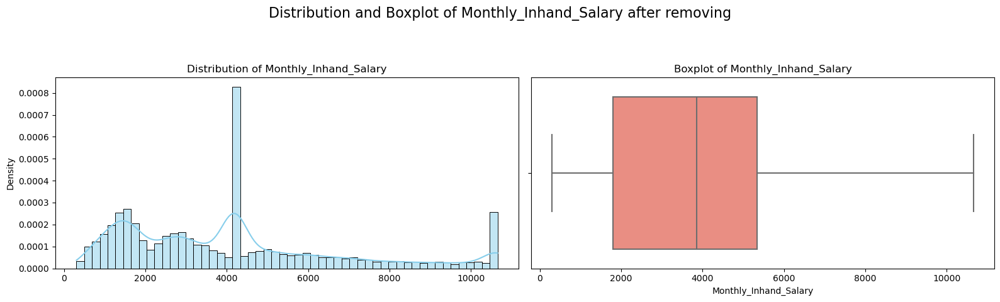

In [69]:
# Visualize 'Monthly_Inhand_Salary'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
fig.suptitle('Distribution and Boxplot of Monthly_Inhand_Salary after removing', fontsize=16)
sns.histplot(df['Monthly_Inhand_Salary'], ax=axes[0], kde=True, color='skyblue', stat="density", common_norm=False)
axes[0].set_title('Distribution of Monthly_Inhand_Salary')
axes[0].set_xlabel("")
sns.boxplot(x=df['Monthly_Inhand_Salary'], ax=axes[1], color='salmon')
axes[1].set_title('Boxplot of Monthly_Inhand_Salary')
plt.tight_layout(rect=[0, 0.03, 1, 0.9])
plt.show()

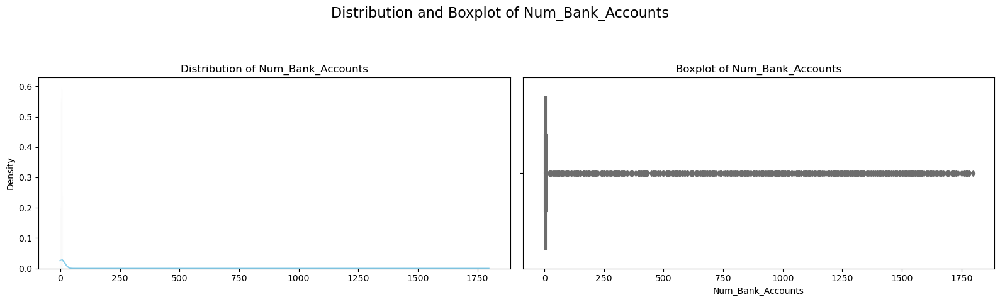

In [70]:
# Visualize 'Num_Bank_Accounts'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
fig.suptitle('Distribution and Boxplot of Num_Bank_Accounts', fontsize=16)
sns.histplot(df['Num_Bank_Accounts'], ax=axes[0], kde=True, color='skyblue', stat="density", common_norm=False)
axes[0].set_title('Distribution of Num_Bank_Accounts')
axes[0].set_xlabel("")
sns.boxplot(x=df['Num_Bank_Accounts'], ax=axes[1], color='salmon')
axes[1].set_title('Boxplot of Num_Bank_Accounts')
plt.tight_layout(rect=[0, 0.03, 1, 0.9])
plt.show()


**Apply log Transformer**

In [71]:
#removing negative values
df['Num_Bank_Accounts'] = df['Num_Bank_Accounts'] + abs(df['Num_Bank_Accounts'].min()) + 1

df.Num_Bank_Accounts.describe()

count   50000.000
mean       18.838
std       116.397
min         1.000
25%         5.000
50%         8.000
75%         9.000
max      1800.000
Name: Num_Bank_Accounts, dtype: float64

In [72]:
# Apply log transformation
df['Num_Bank_Accounts'] = np.log1p(df['Num_Bank_Accounts'])

# Display summary statistics
print(df['Num_Bank_Accounts'].describe())


count   50000.000
mean        2.123
std         0.624
min         0.693
25%         1.792
50%         2.197
75%         2.303
max         7.496
Name: Num_Bank_Accounts, dtype: float64


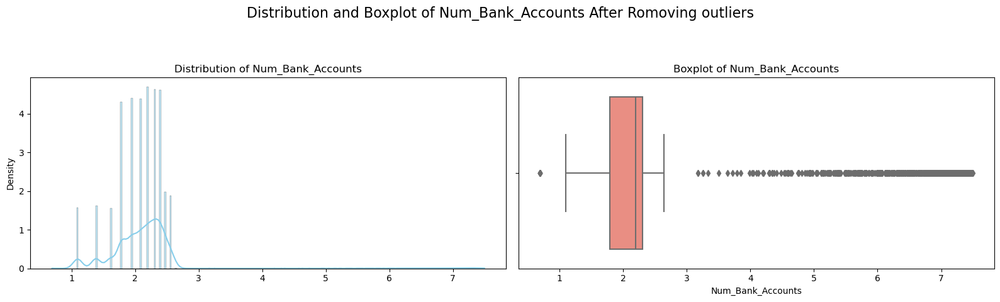

In [73]:
# Visualize 'Num_Bank_Accounts'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
fig.suptitle('Distribution and Boxplot of Num_Bank_Accounts After Romoving outliers', fontsize=16)
sns.histplot(df['Num_Bank_Accounts'], ax=axes[0], kde=True, color='skyblue', stat="density", common_norm=False)
axes[0].set_title('Distribution of Num_Bank_Accounts')
axes[0].set_xlabel("")
sns.boxplot(x=df['Num_Bank_Accounts'], ax=axes[1], color='salmon')
axes[1].set_title('Boxplot of Num_Bank_Accounts')
plt.tight_layout(rect=[0, 0.03, 1, 0.9])
plt.show()

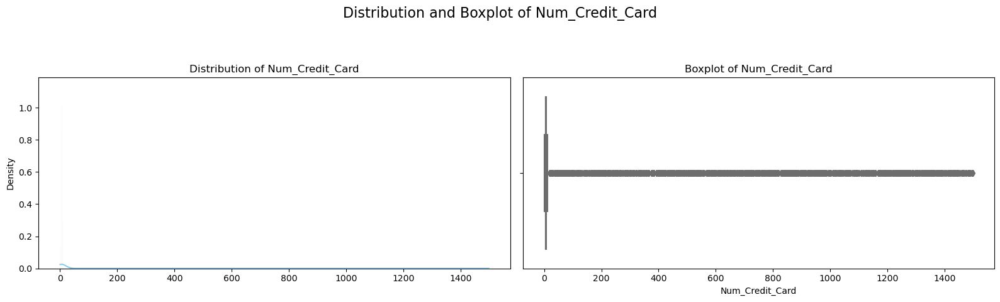

In [74]:
# Visualize 'Num_Credit_Card'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
fig.suptitle('Distribution and Boxplot of Num_Credit_Card', fontsize=16)
sns.histplot(df['Num_Credit_Card'], ax=axes[0], kde=True, color='skyblue', stat="density", common_norm=False)
axes[0].set_title('Distribution of Num_Credit_Card')
axes[0].set_xlabel("")
sns.boxplot(x=df['Num_Credit_Card'], ax=axes[1], color='salmon')
axes[1].set_title('Boxplot of Num_Credit_Card')
plt.tight_layout(rect=[0, 0.03, 1, 0.9])
plt.show()


**Num_Credit_Card for this column I don't understand it's distribution that's why I'm using Box-Cox transformation**

In [75]:
#removing negative values
df['Num_Credit_Card'] = df['Num_Credit_Card'] + abs(df['Num_Credit_Card'].min()) + 1
df['Num_Bank_Accounts'] = np.log1p(df['Num_Bank_Accounts'])

df.Num_Credit_Card.describe()

count   50000.000
mean       23.921
std       129.315
min         1.000
25%         5.000
50%         6.000
75%         8.000
max      1500.000
Name: Num_Credit_Card, dtype: float64

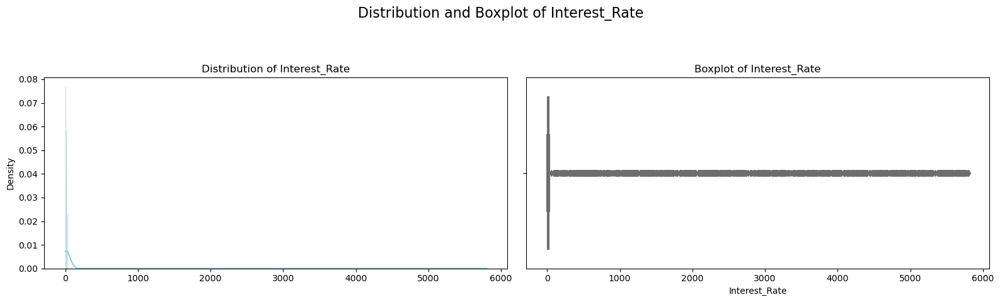

In [76]:
# Visualize 'Interest_Rate'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
fig.suptitle('Distribution and Boxplot of Interest_Rate', fontsize=16)
sns.histplot(df['Interest_Rate'], ax=axes[0], kde=True, color='skyblue', stat="density", common_norm=False)
axes[0].set_title('Distribution of Interest_Rate')
axes[0].set_xlabel("")
sns.boxplot(x=df['Interest_Rate'], ax=axes[1], color='salmon')
axes[1].set_title('Boxplot of Interest_Rate')
plt.tight_layout(rect=[0, 0.03, 1, 0.9])
plt.show()


In [77]:
from scipy.stats import boxcox
transformed_data, lambda_value = boxcox(df['Interest_Rate'], lmbda=None)
df['Interest_Rate'] = np.power((transformed_data * lambda_value) + 1, 1 / lambda_value)
df.Interest_Rate.describe()

count   50000.000
mean       68.773
std       451.602
min         1.000
25%         8.000
50%        13.000
75%        20.000
max      5799.000
Name: Interest_Rate, dtype: float64

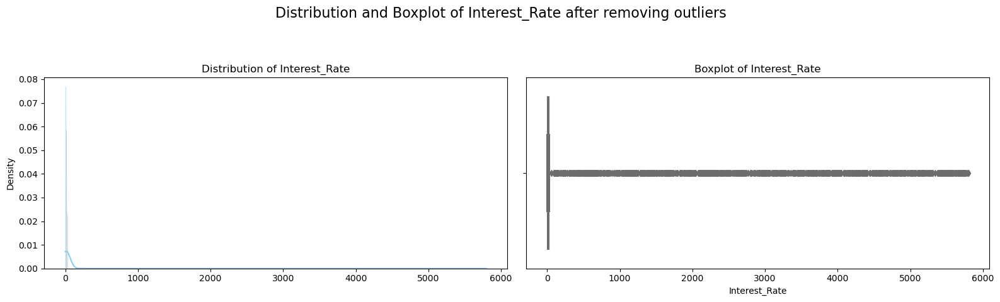

In [78]:
# Visualize 'Interest_Rate'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
fig.suptitle('Distribution and Boxplot of Interest_Rate after removing outliers', fontsize=16)
sns.histplot(df['Interest_Rate'], ax=axes[0], kde=True, color='skyblue', stat="density", common_norm=False)
axes[0].set_title('Distribution of Interest_Rate')
axes[0].set_xlabel("")
sns.boxplot(x=df['Interest_Rate'], ax=axes[1], color='salmon')
axes[1].set_title('Boxplot of Interest_Rate')
plt.tight_layout(rect=[0, 0.03, 1, 0.9])
plt.show()

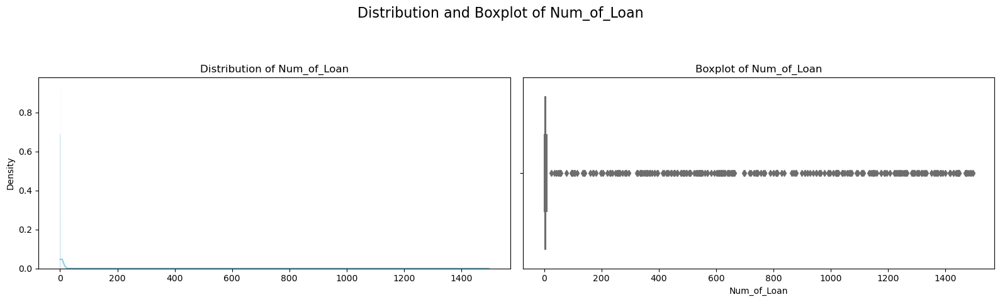

In [79]:
# Visualize 'Num_of_Loan'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
fig.suptitle('Distribution and Boxplot of Num_of_Loan', fontsize=16)
sns.histplot(df['Num_of_Loan'], ax=axes[0], kde=True, color='skyblue', stat="density", common_norm=False)
axes[0].set_title('Distribution of Num_of_Loan')
axes[0].set_xlabel("")
sns.boxplot(x=df['Num_of_Loan'], ax=axes[1], color='salmon')
axes[1].set_title('Boxplot of Num_of_Loan')
plt.tight_layout(rect=[0, 0.03, 1, 0.9])
plt.show()


In [80]:
#removing negative values
df['Num_of_Loan'] = df['Num_of_Loan'] + abs(df['Num_of_Loan'].min()) + 1

df['Num_of_Loan'] = np.log1p(df['Num_of_Loan'])

df.Num_of_Loan.describe()

count   50000.000
mean        1.641
std         0.594
min         0.693
25%         1.386
50%         1.609
75%         1.946
max         7.312
Name: Num_of_Loan, dtype: float64

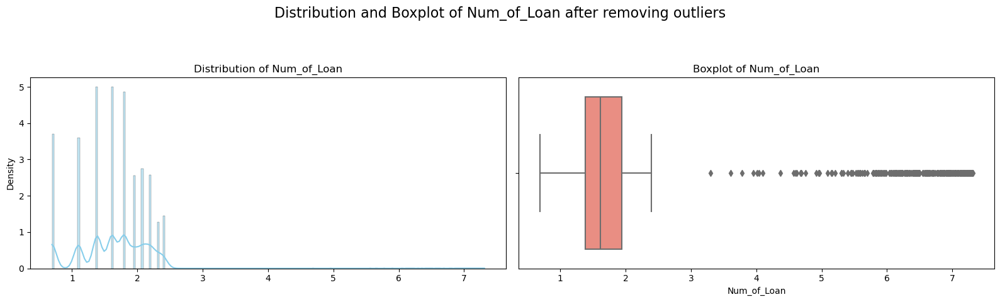

In [81]:
# Visualize 'Num_of_Loan'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
fig.suptitle('Distribution and Boxplot of Num_of_Loan after removing outliers', fontsize=16)
sns.histplot(df['Num_of_Loan'], ax=axes[0], kde=True, color='skyblue', stat="density", common_norm=False)
axes[0].set_title('Distribution of Num_of_Loan')
axes[0].set_xlabel("")
sns.boxplot(x=df['Num_of_Loan'], ax=axes[1], color='salmon')
axes[1].set_title('Boxplot of Num_of_Loan')
plt.tight_layout(rect=[0, 0.03, 1, 0.9])
plt.show()

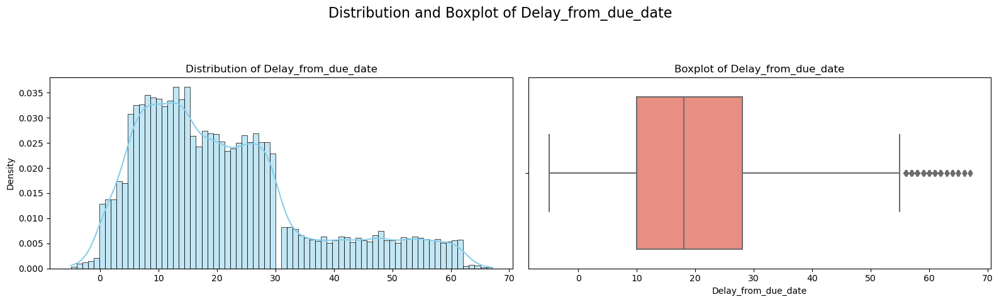

In [82]:
# Visualize 'Delay_from_due_date'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
fig.suptitle('Distribution and Boxplot of Delay_from_due_date', fontsize=16)
sns.histplot(df['Delay_from_due_date'], ax=axes[0], kde=True, color='skyblue', stat="density", common_norm=False)
axes[0].set_title('Distribution of Delay_from_due_date')
axes[0].set_xlabel("")
sns.boxplot(x=df['Delay_from_due_date'], ax=axes[1], color='salmon')
axes[1].set_title('Boxplot of Delay_from_due_date')
plt.tight_layout(rect=[0, 0.03, 1, 0.9])
plt.show()


**Removing outliers from Delay_from_due_date column**

In [83]:
percentile25 = df.Delay_from_due_date.quantile(0.25)
percentile75 = df.Delay_from_due_date.quantile(0.75)

iqr = percentile75 - percentile25

upper_limit = percentile75 + 1.5 * iqr
lower_limit = percentile25 - 1.5 * iqr

df['Delay_from_due_date'] = np.where(
    df.Delay_from_due_date > upper_limit,
    upper_limit,
    np.where(
        df.Delay_from_due_date < lower_limit,
        lower_limit,
        df.Delay_from_due_date
    )
)

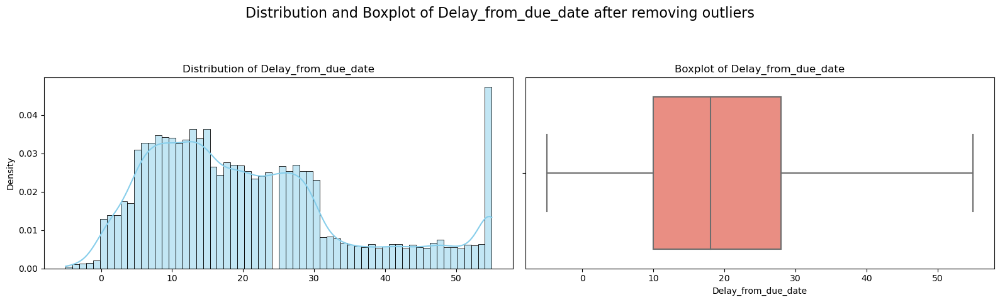

In [84]:
# Visualize 'Delay_from_due_date'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
fig.suptitle('Distribution and Boxplot of Delay_from_due_date after removing outliers', fontsize=16)
sns.histplot(df['Delay_from_due_date'], ax=axes[0], kde=True, color='skyblue', stat="density", common_norm=False)
axes[0].set_title('Distribution of Delay_from_due_date')
axes[0].set_xlabel("")
sns.boxplot(x=df['Delay_from_due_date'], ax=axes[1], color='salmon')
axes[1].set_title('Boxplot of Delay_from_due_date')
plt.tight_layout(rect=[0, 0.03, 1, 0.9])
plt.show()


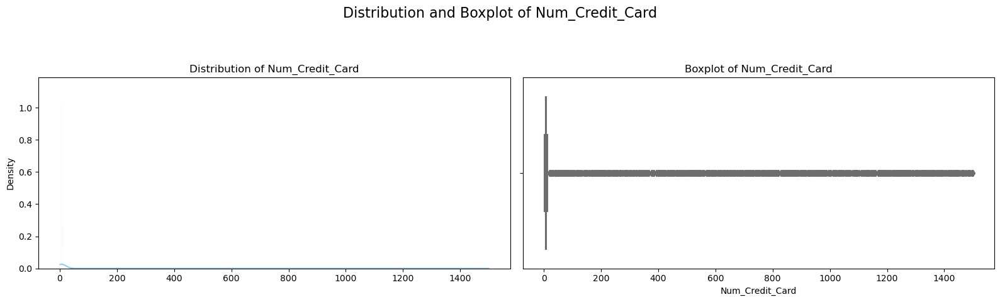

In [85]:
# Visualize 'Num_Credit_Card'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
fig.suptitle('Distribution and Boxplot of Num_Credit_Card', fontsize=16)
sns.histplot(df['Num_Credit_Card'], ax=axes[0], kde=True, color='skyblue', stat="density", common_norm=False)
axes[0].set_title('Distribution of Num_Credit_Card')
axes[0].set_xlabel("")
sns.boxplot(x=df['Num_Credit_Card'], ax=axes[1], color='salmon')
axes[1].set_title('Boxplot of Num_Credit_Card')
plt.tight_layout(rect=[0, 0.03, 1, 0.9])
plt.show()


In [86]:
df['Num_Credit_Card'] = np.log1p(df['Num_Credit_Card'])

df.Num_Credit_Card.describe()

count   50000.000
mean        2.082
std         0.735
min         0.693
25%         1.792
50%         1.946
75%         2.197
max         7.314
Name: Num_Credit_Card, dtype: float64

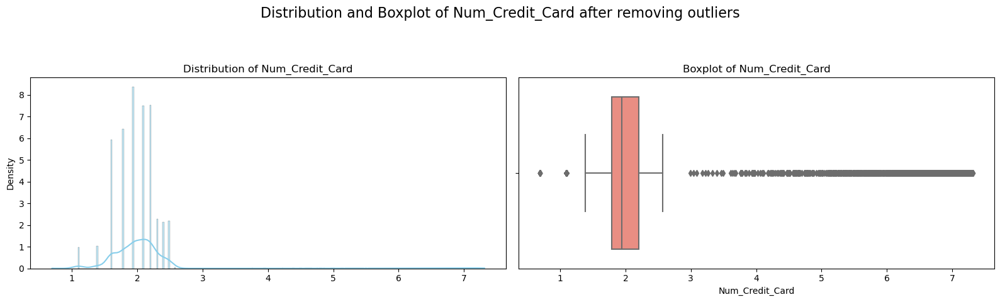

In [87]:
# Visualize 'Num_Credit_Card'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
fig.suptitle('Distribution and Boxplot of Num_Credit_Card after removing outliers', fontsize=16)
sns.histplot(df['Num_Credit_Card'], ax=axes[0], kde=True, color='skyblue', stat="density", common_norm=False)
axes[0].set_title('Distribution of Num_Credit_Card')
axes[0].set_xlabel("")
sns.boxplot(x=df['Num_Credit_Card'], ax=axes[1], color='salmon')
axes[1].set_title('Boxplot of Num_Credit_Card')
plt.tight_layout(rect=[0, 0.03, 1, 0.9])
plt.show()


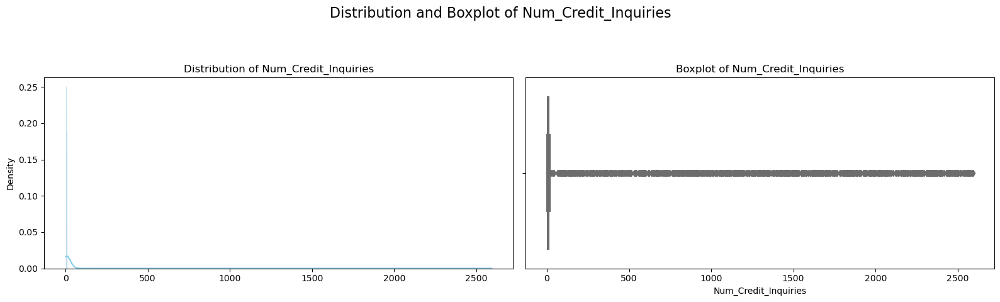

In [88]:
# Visualize 'Num_Credit_Inquiries'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
fig.suptitle('Distribution and Boxplot of Num_Credit_Inquiries', fontsize=16)
sns.histplot(df['Num_Credit_Inquiries'], ax=axes[0], kde=True, color='skyblue', stat="density", common_norm=False)
axes[0].set_title('Distribution of Num_Credit_Inquiries')
axes[0].set_xlabel("")
sns.boxplot(x=df['Num_Credit_Inquiries'], ax=axes[1], color='salmon')
axes[1].set_title('Boxplot of Num_Credit_Inquiries')
plt.tight_layout(rect=[0, 0.03, 1, 0.9])
plt.show()


In [89]:
from scipy.stats import boxcox

#removing negative values
df['Num_Credit_Inquiries'] = df['Num_Credit_Inquiries'] + abs(df['Num_Credit_Inquiries'].min()) + 1

transformed_data, lambda_value = boxcox(df['Num_Credit_Inquiries'], lmbda=None)

df['Num_Credit_Inquiries'] = np.power((transformed_data * lambda_value) + 1, 1 / lambda_value)


df.Num_Credit_Inquiries.describe()

count   50000.000
mean       30.679
std       194.956
min         1.000
25%         5.000
50%         8.000
75%        12.000
max      2594.000
Name: Num_Credit_Inquiries, dtype: float64

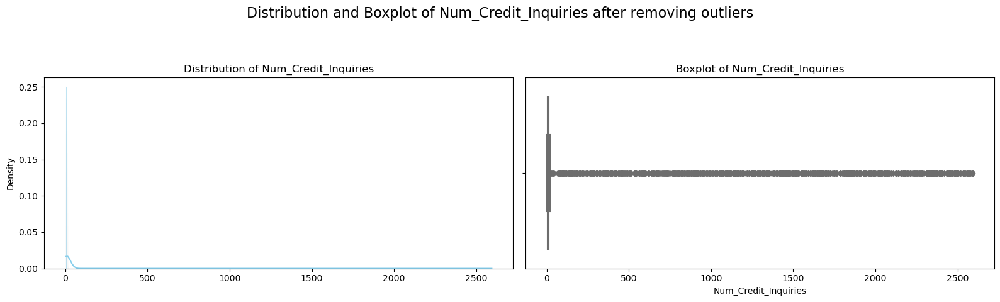

In [90]:
# Visualize 'Num_Credit_Inquiries'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
fig.suptitle('Distribution and Boxplot of Num_Credit_Inquiries after removing outliers', fontsize=16)
sns.histplot(df['Num_Credit_Inquiries'], ax=axes[0], kde=True, color='skyblue', stat="density", common_norm=False)
axes[0].set_title('Distribution of Num_Credit_Inquiries')
axes[0].set_xlabel("")
sns.boxplot(x=df['Num_Credit_Inquiries'], ax=axes[1], color='salmon')
axes[1].set_title('Boxplot of Num_Credit_Inquiries')
plt.tight_layout(rect=[0, 0.03, 1, 0.9])
plt.show()


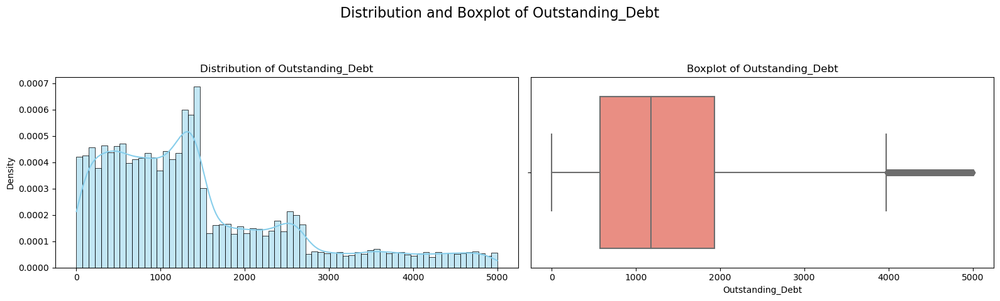

In [91]:
# Visualize 'Outstanding_Debt'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
fig.suptitle('Distribution and Boxplot of Outstanding_Debt', fontsize=16)
sns.histplot(df['Outstanding_Debt'], ax=axes[0], kde=True, color='skyblue', stat="density", common_norm=False)
axes[0].set_title('Distribution of Outstanding_Debt')
axes[0].set_xlabel("")
sns.boxplot(x=df['Outstanding_Debt'], ax=axes[1], color='salmon')
axes[1].set_title('Boxplot of Outstanding_Debt')
plt.tight_layout(rect=[0, 0.03, 1, 0.9])
plt.show()

**Removing outliers from Outstanding_Debt column**

In [92]:
percentile25 = df.Outstanding_Debt.quantile(0.25)
percentile75 = df.Outstanding_Debt.quantile(0.75)

iqr = percentile75 - percentile25

upper_limit = percentile75 + 1.5 * iqr
lower_limit = percentile25 - 1.5 * iqr

df['Delay_from_due_date'] = np.where(
    df.Outstanding_Debt > upper_limit,
    upper_limit,
    np.where(
        df.Outstanding_Debt < lower_limit,
        lower_limit,
        df.Outstanding_Debt
    )
)

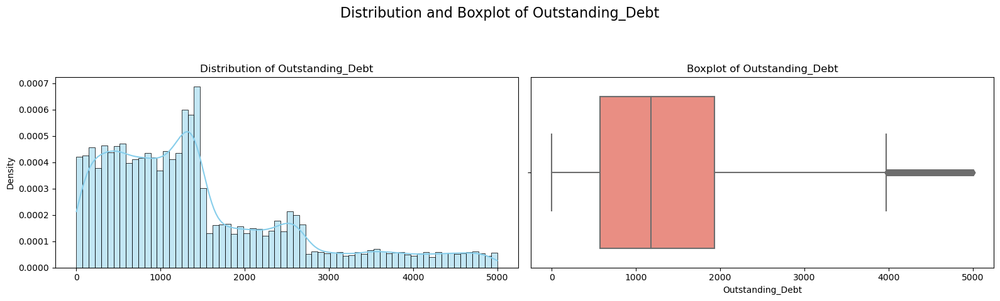

In [93]:
# Visualize 'Outstanding_Debt'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
fig.suptitle('Distribution and Boxplot of Outstanding_Debt', fontsize=16)
sns.histplot(df['Outstanding_Debt'], ax=axes[0], kde=True, color='skyblue', stat="density", common_norm=False)
axes[0].set_title('Distribution of Outstanding_Debt')
axes[0].set_xlabel("")
sns.boxplot(x=df['Outstanding_Debt'], ax=axes[1], color='salmon')
axes[1].set_title('Boxplot of Outstanding_Debt')
plt.tight_layout(rect=[0, 0.03, 1, 0.9])
plt.show()

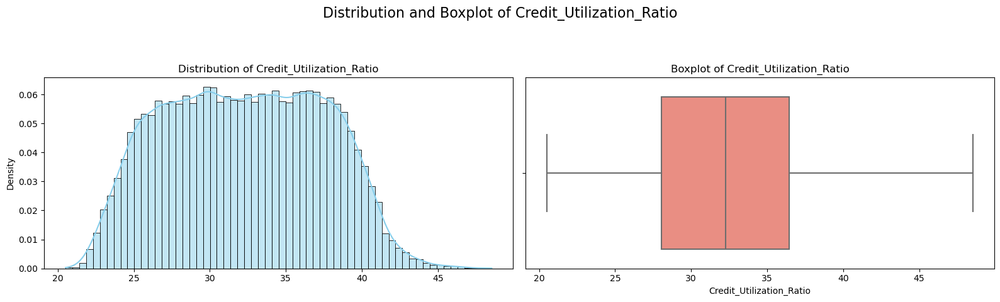

In [94]:
# Visualize 'Credit_Utilization_Ratio'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
fig.suptitle('Distribution and Boxplot of Credit_Utilization_Ratio', fontsize=16)
sns.histplot(df['Credit_Utilization_Ratio'], ax=axes[0], kde=True, color='skyblue', stat="density", common_norm=False)
axes[0].set_title('Distribution of Credit_Utilization_Ratio')
axes[0].set_xlabel("")
sns.boxplot(x=df['Credit_Utilization_Ratio'], ax=axes[1], color='salmon')
axes[1].set_title('Boxplot of Credit_Utilization_Ratio')
plt.tight_layout(rect=[0, 0.03, 1, 0.9])
plt.show()

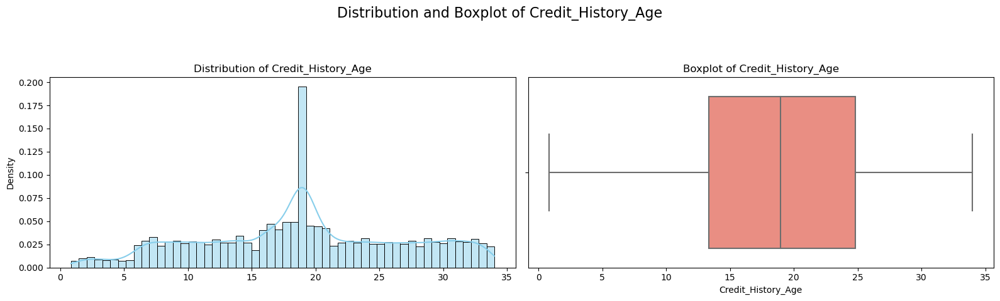

In [95]:
# Visualize 'Credit_History_Age'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
fig.suptitle('Distribution and Boxplot of Credit_History_Age', fontsize=16)
sns.histplot(df['Credit_History_Age'], ax=axes[0], kde=True, color='skyblue', stat="density", common_norm=False)
axes[0].set_title('Distribution of Credit_History_Age')
axes[0].set_xlabel("")
sns.boxplot(x=df['Credit_History_Age'], ax=axes[1], color='salmon')
axes[1].set_title('Boxplot of Credit_History_Age')
plt.tight_layout(rect=[0, 0.03, 1, 0.9])
plt.show()

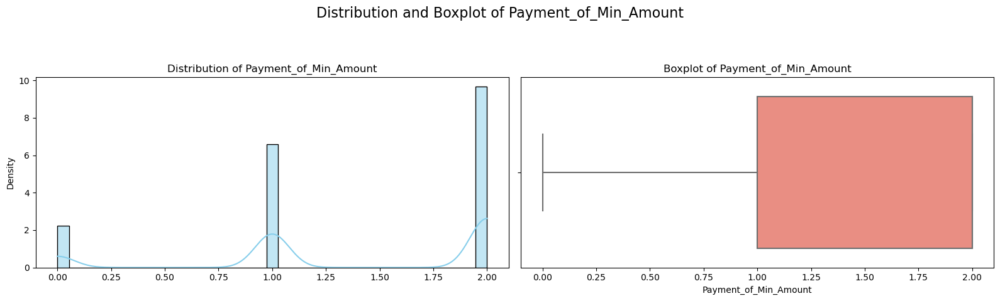

In [96]:
# Visualize 'Payment_of_Min_Amount'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
fig.suptitle('Distribution and Boxplot of Payment_of_Min_Amount', fontsize=16)
sns.histplot(df['Payment_of_Min_Amount'], ax=axes[0], kde=True, color='skyblue', stat="density", common_norm=False)
axes[0].set_title('Distribution of Payment_of_Min_Amount')
axes[0].set_xlabel("")
sns.boxplot(x=df['Payment_of_Min_Amount'], ax=axes[1], color='salmon')
axes[1].set_title('Boxplot of Payment_of_Min_Amount')
plt.tight_layout(rect=[0, 0.03, 1, 0.9])
plt.show()

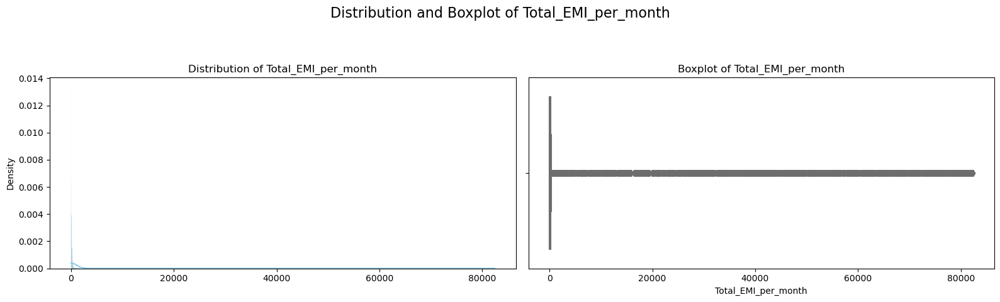

In [97]:
# Visualize 'Total_EMI_per_month'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
fig.suptitle('Distribution and Boxplot of Total_EMI_per_month', fontsize=16)
sns.histplot(df['Total_EMI_per_month'], ax=axes[0], kde=True, color='skyblue', stat="density", common_norm=False)
axes[0].set_title('Distribution of Total_EMI_per_month')
axes[0].set_xlabel("")
sns.boxplot(x=df['Total_EMI_per_month'], ax=axes[1], color='salmon')
axes[1].set_title('Boxplot of Total_EMI_per_month')
plt.tight_layout(rect=[0, 0.03, 1, 0.9])
plt.show()

In [98]:
df['Total_EMI_per_month'] = np.log1p(df['Total_EMI_per_month'])
df.Total_EMI_per_month.describe()

count   50000.000
mean        4.207
std         1.980
min         0.000
25%         3.503
50%         4.327
75%         5.177
max        11.319
Name: Total_EMI_per_month, dtype: float64

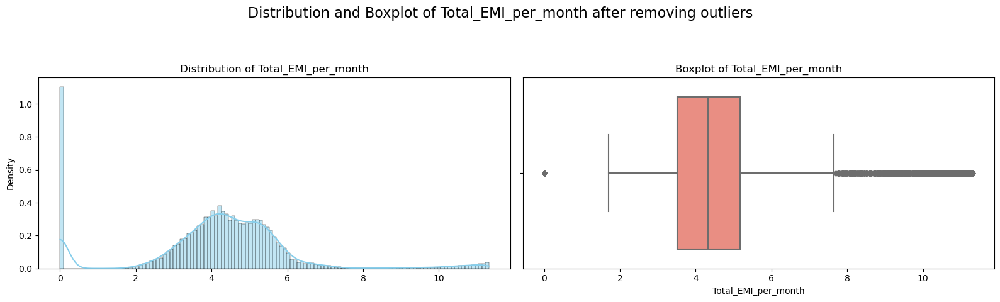

In [99]:
# Visualize 'Total_EMI_per_month'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
fig.suptitle('Distribution and Boxplot of Total_EMI_per_month after removing outliers', fontsize=16)
sns.histplot(df['Total_EMI_per_month'], ax=axes[0], kde=True, color='skyblue', stat="density", common_norm=False)
axes[0].set_title('Distribution of Total_EMI_per_month')
axes[0].set_xlabel("")
sns.boxplot(x=df['Total_EMI_per_month'], ax=axes[1], color='salmon')
axes[1].set_title('Boxplot of Total_EMI_per_month')
plt.tight_layout(rect=[0, 0.03, 1, 0.9])
plt.show()

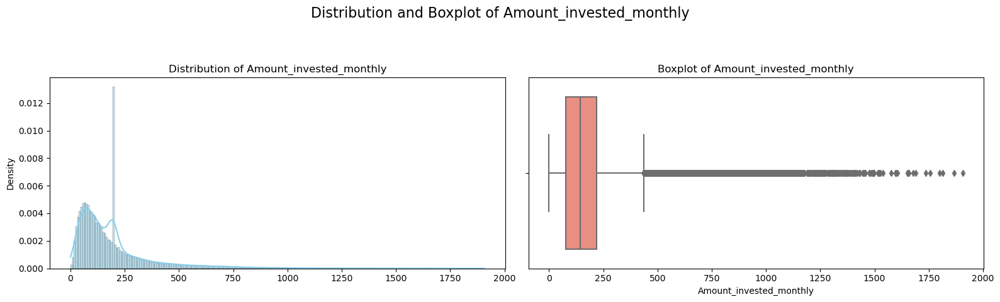

In [100]:
# Visualize 'Amount_invested_monthly'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
fig.suptitle('Distribution and Boxplot of Amount_invested_monthly', fontsize=16)
sns.histplot(df['Amount_invested_monthly'], ax=axes[0], kde=True, color='skyblue', stat="density", common_norm=False)
axes[0].set_title('Distribution of Amount_invested_monthly')
axes[0].set_xlabel("")
sns.boxplot(x=df['Amount_invested_monthly'], ax=axes[1], color='salmon')
axes[1].set_title('Boxplot of Amount_invested_monthly')
plt.tight_layout(rect=[0, 0.03, 1, 0.9])
plt.show()

In [101]:
percentile25 = df.Amount_invested_monthly.quantile(0.25)
percentile75 = df.Amount_invested_monthly.quantile(0.75)

iqr = percentile75 - percentile25

upper_limit = percentile75 + 1.5 * iqr
lower_limit = percentile25 - 1.5 * iqr

df['Amount_invested_monthly'] = np.where(
    df.Amount_invested_monthly > upper_limit,
    upper_limit,
    np.where(
        df.Amount_invested_monthly < lower_limit,
        lower_limit,
        df.Amount_invested_monthly
    )
)

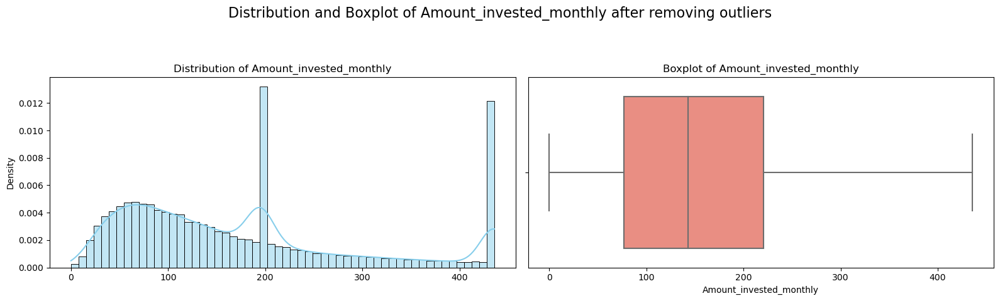

In [102]:
# Visualize 'Amount_invested_monthly'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
fig.suptitle('Distribution and Boxplot of Amount_invested_monthly after removing outliers', fontsize=16)
sns.histplot(df['Amount_invested_monthly'], ax=axes[0], kde=True, color='skyblue', stat="density", common_norm=False)
axes[0].set_title('Distribution of Amount_invested_monthly')
axes[0].set_xlabel("")
sns.boxplot(x=df['Amount_invested_monthly'], ax=axes[1], color='salmon')
axes[1].set_title('Boxplot of Amount_invested_monthly')
plt.tight_layout(rect=[0, 0.03, 1, 0.9])
plt.show()

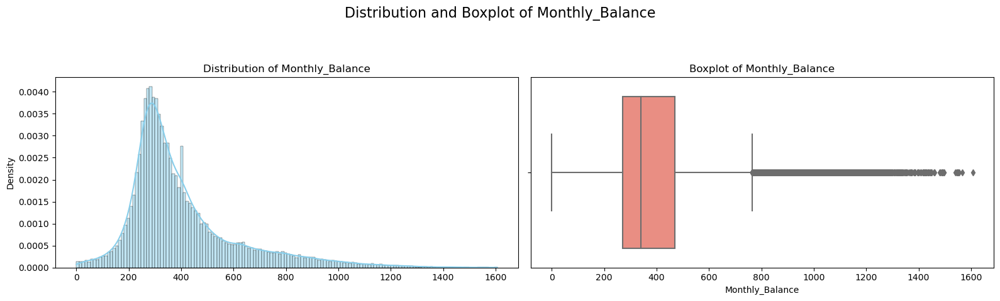

In [103]:
# Visualize 'Monthly_Balance'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
fig.suptitle('Distribution and Boxplot of Monthly_Balance', fontsize=16)
sns.histplot(df['Monthly_Balance'], ax=axes[0], kde=True, color='skyblue', stat="density", common_norm=False)
axes[0].set_title('Distribution of Monthly_Balance')
axes[0].set_xlabel("")
sns.boxplot(x=df['Monthly_Balance'], ax=axes[1], color='salmon')
axes[1].set_title('Boxplot of Monthly_Balance')
plt.tight_layout(rect=[0, 0.03, 1, 0.9])
plt.show()

In [104]:
percentile25 = df.Monthly_Balance.quantile(0.25)
percentile75 = df.Monthly_Balance.quantile(0.75)

iqr = percentile75 - percentile25

upper_limit = percentile75 + 1.5 * iqr
lower_limit = percentile25 - 1.5 * iqr

df['Monthly_Balance'] = np.where(
    df.Monthly_Balance > upper_limit,
    upper_limit,
    np.where(
        df.Monthly_Balance < lower_limit,
        lower_limit,
        df.Monthly_Balance
    )
)

df.Monthly_Balance.describe()

count   50000.000
mean      388.694
std       173.506
min         0.103
25%       271.119
50%       338.992
75%       468.571
max       764.750
Name: Monthly_Balance, dtype: float64

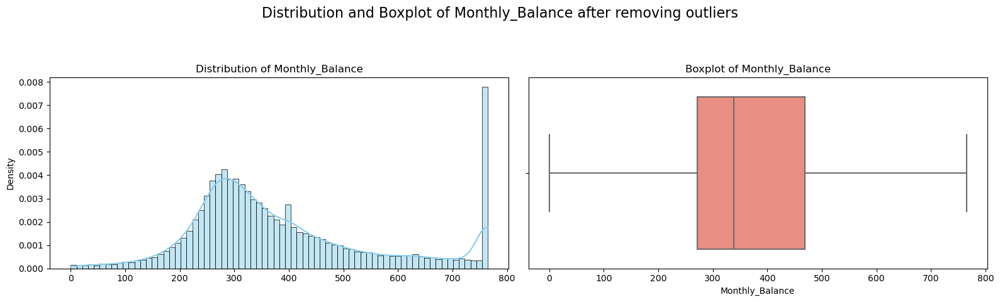

In [105]:
# Visualize 'Monthly_Balance'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 5))
fig.suptitle('Distribution and Boxplot of Monthly_Balance after removing outliers', fontsize=16)
sns.histplot(df['Monthly_Balance'], ax=axes[0], kde=True, color='skyblue', stat="density", common_norm=False)
axes[0].set_title('Distribution of Monthly_Balance')
axes[0].set_xlabel("")
sns.boxplot(x=df['Monthly_Balance'], ax=axes[1], color='salmon')
axes[1].set_title('Boxplot of Monthly_Balance')
plt.tight_layout(rect=[0, 0.03, 1, 0.9])
plt.show()

# **Choosing Target Variable**

"Monthly Balance" can have different meanings depending on the context, but here are the two most likely interpretations:

**1. Financial Account Balance:** This is the most common meaning. It refers to the amount of money remaining in your bank account at the end of each month. This applies to checking accounts, savings accounts, credit card accounts, or any other type of financial account.

**2. Budget Tracking:** In budgeting, "Monthly Balance" refers to the money left after paying all your bills and expenses for the month. This helps track progress towards financial goals like saving for a house or paying off debt.

In [106]:
X = df.drop('Credit_Mix', axis=1)
y = df['Credit_Mix']

In [107]:
y.value_counts()

Standard    18379
Good        12260
neutral      9805
Bad          9556
Name: Credit_Mix, dtype: int64

# **Imbalanced data Handle**

In [108]:
standard = (18379/(18379+12260+9805+9556)) *100
good = (12260/(18379+12260+9805+9556)) *100
neutral = (9805/(18379+12260+9805+9556)) *100
bad = (9556/(18379+12260+9805+9556)) *100

print('Standard {} percent of total Credit Mix'.format(standard))
print('Good {} percent of total Credit Mix'.format(good))
print('Neutral {} percent of total Credit Mix'.format(neutral))
print('Bad {} percent of total Credit Mix'.format(bad))

Standard 36.758 percent of total Credit Mix
Good 24.52 percent of total Credit Mix
Neutral 19.61 percent of total Credit Mix
Bad 19.112000000000002 percent of total Credit Mix


In [109]:
from imblearn.over_sampling import RandomOverSampler
over = RandomOverSampler(random_state=100)
X_new , y_new = over.fit_resample(X,y)
X_new.shape, y_new.shape

((73516, 20), (73516,))

In [110]:
y_new.value_counts()

Good        18379
neutral     18379
Standard    18379
Bad         18379
Name: Credit_Mix, dtype: int64

In [111]:
X_new.head()

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
0,September,23.000,Scientist,9.858,1824.843,1.027,1.792,3.000,1.792,809.980,7.000,11.270,2023.000,809.980,35.030,22.750,1.000,3.923,236.643,186.267
1,October,24.000,Scientist,9.858,1824.843,1.027,1.792,3.000,1.792,809.980,9.000,13.270,5.000,809.980,33.053,22.833,1.000,3.923,21.465,361.444
2,November,24.000,Scientist,9.858,1824.843,1.027,1.792,3.000,1.792,809.980,4.000,12.270,5.000,809.980,33.812,18.938,1.000,3.923,148.234,264.675
3,December,33.820,Scientist,9.858,4182.004,1.027,1.792,3.000,1.792,809.980,5.000,11.270,5.000,809.980,32.431,23.000,1.000,3.923,39.083,343.827
4,September,28.000,Mechanic,10.459,3037.987,0.959,1.792,6.000,1.099,605.030,1.000,5.420,6.000,605.030,25.927,27.250,1.000,2.987,39.684,485.298


**Apply MinMax() for Numberical Columns and oneHOt of categorical columns and then apply PCA**

In [112]:
columns_to_onehot = ['Month', 'Occupation'] #'Payment_Behaviour'

# Apply one-hot encoding to the specified columns
X_new = pd.get_dummies(X_new, columns=columns_to_onehot)
X_new.sample(10)

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,...,Occupation_Entrepreneur,Occupation_Journalist,Occupation_Lawyer,Occupation_Manager,Occupation_Mechanic,Occupation_Media_Manager,Occupation_Musician,Occupation_Scientist,Occupation_Teacher,Occupation_Writer
28484,27.000,11.122,5626.363,1.271,2.303,34.000,2.398,3972.035,20.000,0.580,...,0,0,0,0,0,0,0,0,0,0
36165,15.000,11.303,7043.563,1.223,2.303,24.000,1.386,2345.240,17.000,13.530,...,0,0,0,0,0,0,0,0,0,0
9262,21.000,11.388,4182.004,1.125,1.386,10.000,0.693,723.630,3.000,1.400,...,0,0,0,0,0,0,0,0,0,0
72128,41.000,12.014,3043.097,1.195,2.079,21.000,1.946,2077.810,15.000,13.450,...,0,0,0,0,0,0,0,0,0,0
9566,32.000,11.359,6871.028,1.223,2.197,18.000,2.079,561.740,11.000,11.640,...,0,0,0,0,0,0,0,0,0,0
40113,35.000,11.266,6526.033,1.125,2.197,8.000,1.792,884.790,20.000,6.340,...,0,0,0,0,0,1,0,0,0,0
29197,33.000,10.355,2664.096,1.027,2.079,18.000,1.609,362.310,10.000,17.260,...,0,0,0,1,0,0,0,0,0,0
9101,34.000,12.014,4637.930,1.195,2.485,29.000,1.946,2939.680,15.000,20.070,...,0,0,0,0,0,0,0,0,1,0
30503,41.000,10.663,3459.992,1.195,1.946,7.000,0.693,96.850,17.000,7.850,...,0,0,0,1,0,0,0,0,0,0
56559,18.000,9.577,4182.004,1.248,1.946,34.000,2.398,3155.470,18.000,28.840,...,0,0,0,0,0,0,0,0,0,1


**Split Dataset**

In [113]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_new, y_new, test_size=0.2, random_state=42)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((58812, 37), (14704, 37), (58812,), (14704,))

**Apply MinMax**

In [114]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler


scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

X_train_scaled_df = pd.DataFrame(X_train_scaled)
X_test_scaled_df = pd.DataFrame(X_test_scaled)

In [115]:
X_train_scaled_df.head()

,0,1,2,3,4,5,6,7,8,9,...,27,28,29,30,31,32,33,34,35,36
0,0.422,0.800,1.003,0.413,0.140,-0.091,-0.103,-0.135,-0.091,-0.371,...,-0.268,-0.263,-0.279,-0.265,-0.271,-0.267,-0.260,-0.267,-0.266,3.820
1,0.227,-1.051,-0.956,-0.012,-0.416,-0.113,1.066,-1.097,-0.101,0.691,...,-0.268,-0.263,-0.279,-0.265,-0.271,3.749,-0.260,-0.267,-0.266,-0.262
2,2.172,-1.429,0.044,-0.012,-0.665,-0.131,-0.964,-0.444,-0.121,-1.226,...,-0.268,-0.263,-0.279,-0.265,-0.271,-0.267,-0.260,-0.267,-0.266,-0.262
3,0.033,0.802,1.067,0.216,0.414,-0.093,1.066,2.142,-0.050,2.496,...,-0.268,-0.263,-0.279,-0.265,-0.271,-0.267,-0.260,3.744,-0.266,-0.262
4,1.783,-0.265,-0.370,-0.281,0.140,-0.147,-1.647,-1.268,-0.131,-0.495,...,-0.268,-0.263,-0.279,-0.265,-0.271,-0.267,3.840,-0.267,-0.266,-0.262


In [116]:
X_train_scaled_df.shape, X_test_scaled_df.shape

((58812, 37), (14704, 37))

**Apply PCA**

In [117]:
from sklearn.decomposition import PCA

pca = PCA(n_components=3)  # Adjust the number of components as needed

X_train_pca = pca.fit_transform(X_train_scaled_df)
X_test_pca = pca.transform(X_test_scaled_df)

X_train_pca_df = pd.DataFrame(X_train_pca, columns=[f'pca_{i+1}' for i in range(3)])
X_test_pca_df = pd.DataFrame(X_test_pca, columns=[f'pca_{i+1}' for i in range(3)])


In [118]:
X_train_pca_df.head()

,pca_1,pca_2,pca_3
0,-0.284,1.164,0.579
1,-0.381,-1.905,-1.050
2,-1.150,-2.498,-0.943
3,2.849,2.878,1.885
4,-2.119,-2.279,-1.507


In [119]:
X_test_pca_df.head()

,pca_1,pca_2,pca_3
0,3.011,-1.565,-1.394
1,3.982,-0.554,1.492
2,-0.372,-1.492,-0.734
3,1.994,0.196,1.559
4,2.333,0.519,-1.386


In [120]:
X_train_pca_df.shape

(58812, 3)

In [121]:
import plotly.express as px

fig = px.scatter_3d(X_train_pca_df, x='pca_1', y='pca_2', z='pca_3', color=y_train)

fig.update_layout(scene=dict(
                    xaxis_title='PC1',
                    yaxis_title='PC2',
                    zaxis_title='PC3'),
                    title='3D Visualization of Training Data after PCA')

fig.show()

In [122]:
import plotly.express as px

fig = px.scatter_3d(X_test_pca_df, x='pca_1', y='pca_2', z='pca_3', color=y_test)

fig.update_layout(
    scene=dict(
        xaxis_title='PC1',
        yaxis_title='PC2',
        zaxis_title='PC3'
    ),
    title='3D Visualization of Test Data after PCA'
)

fig.show()

# **Model Selection:**

**Logistic Regression**

In [123]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix



# Initialize logistic regression model
logreg = LogisticRegression(random_state=42)

# Fit the model on the training data
logreg.fit(X_train_pca_df, y_train)

# Make predictions on the testing data
y_pred = logreg.predict(X_test_pca_df)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
conf_matrix = confusion_matrix(y_test, y_pred)

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

print("Confusion Matrix:")
print(conf_matrix)

Accuracy: 0.5196
Precision: 0.4812
Recall: 0.5196
F1 Score: 0.4874
Confusion Matrix:
[[3025    1  156  600]
 [  11 2919  509  188]
 [ 586  977 1022 1094]
 [ 971 1296  675  674]]


**Apply RandomForestClassifier**

In [124]:
from sklearn.ensemble import RandomForestClassifier



# Initialize Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)

# Fit the model on the training data
rf_classifier.fit(X_train_pca_df, y_train)

# Make predictions on the testing data
y_pred = rf_classifier.predict(X_test_pca_df)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
conf_matrix = confusion_matrix(y_test, y_pred)

# Print the evaluation metrics
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Display the confusion matrix
print("Confusion Matrix:")
print(conf_matrix)

Accuracy: 0.7068
Precision: 0.7042
Recall: 0.7068
F1 Score: 0.6993
Confusion Matrix:
[[3365    0  318   99]
 [   7 3029  416  175]
 [ 482  891 1883  423]
 [ 441  535  524 2116]]


**Support Vector Machine Classifier**

In [126]:
from sklearn.svm import SVC



# Initialize Support Vector Machine Classifier
svm_classifier = SVC(random_state=42)

# Fit the model on the training data
svm_classifier.fit(X_train_pca_df, y_train)

# Make predictions on the testing data
y_pred_svm = svm_classifier.predict(X_test_pca_df)

# Evaluate the model
accuracy_svm = accuracy_score(y_test, y_pred_svm)
precision_svm = precision_score(y_test, y_pred_svm, average='weighted')
recall_svm = recall_score(y_test, y_pred_svm, average='weighted')
f1_svm = f1_score(y_test, y_pred_svm, average='weighted')
conf_matrix_svm = confusion_matrix(y_test, y_pred_svm)

# Print the evaluation metrics for SVM
print("Support Vector Machine (SVM) Metrics:")
print(f"Accuracy: {accuracy_svm:.4f}")
print(f"Precision: {precision_svm:.4f}")
print(f"Recall: {recall_svm:.4f}")
print(f"F1 Score: {f1_svm:.4f}")

# Display the confusion matrix for SVM
print("Confusion Matrix:")
print(conf_matrix_svm)

Support Vector Machine (SVM) Metrics:
Accuracy: 0.5585
Precision: 0.4147
Recall: 0.5585
F1 Score: 0.4686
Confusion Matrix:
[[3408    1  373    0]
 [  18 3236  373    0]
 [ 883 1228 1568    0]
 [1219 1506  891    0]]


C:\Users\Md Monjurul Islam\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



**Gradient Boosting Classifier (e.g., XGBoost)**

In [132]:
!pip install xgboost



[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [143]:
!pip show xgboost

import sys
print(sys.path)


Name: xgboost['C:\\Data Science and ML\\Final Assignment\\Assignment 1', 'C:\\Users\\Md Monjurul Islam\\anaconda3\\python311.zip', 'C:\\Users\\Md Monjurul Islam\\anaconda3\\DLLs', 'C:\\Users\\Md Monjurul Islam\\anaconda3\\Lib', 'C:\\Users\\Md Monjurul Islam\\anaconda3', '', 'C:\\Users\\Md Monjurul Islam\\anaconda3\\Lib\\site-packages', 'C:\\Users\\Md Monjurul Islam\\anaconda3\\Lib\\site-packages\\win32', 'C:\\Users\\Md Monjurul Islam\\anaconda3\\Lib\\site-packages\\win32\\lib', 'C:\\Users\\Md Monjurul Islam\\anaconda3\\Lib\\site-packages\\Pythonwin']

Version: 2.0.3
Summary: XGBoost Python Package
Home-page: 
Author: 
Author-email: Hyunsu Cho <chohyu01@cs.washington.edu>, Jiaming Yuan <jm.yuan@outlook.com>
License: Apache-2.0
Location: C:\Users\Md Monjurul Islam\AppData\Local\Programs\Python\Python311\Lib\site-packages
Requires: numpy, scipy
Required-by: 


In [144]:
!pip install xgboost


from sklearn.preprocessing import LabelEncoder
from xgboost import XGBClassifier


# Convert class labels to integers
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)

# Initialize XGBoost Classifier
xgb_classifier = XGBClassifier(random_state=42)

# Fit the model on the training data
xgb_classifier.fit(X_train_pca_df, y_train_encoded)

# Make predictions on the testing data
y_test_encoded = label_encoder.transform(y_test)
y_pred_xgb = xgb_classifier.predict(X_test_pca_df)

# Evaluate the model
accuracy_xgb = accuracy_score(y_test_encoded, y_pred_xgb)
precision_xgb = precision_score(y_test_encoded, y_pred_xgb, average='weighted')
recall_xgb = recall_score(y_test_encoded, y_pred_xgb, average='weighted')
f1_xgb = f1_score(y_test_encoded, y_pred_xgb, average='weighted')
conf_matrix_xgb = confusion_matrix(y_test_encoded, y_pred_xgb)

# Print the evaluation metrics for XGBoost
print("XGBoost Metrics:")
print(f"Accuracy: {accuracy_xgb:.4f}")
print(f"Precision: {precision_xgb:.4f}")
print(f"Recall: {recall_xgb:.4f}")
print(f"F1 Score: {f1_xgb:.4f}")

# Display the confusion matrix for XGBoost
print("Confusion Matrix:")
print(conf_matrix_xgb)


[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


ModuleNotFoundError: No module named 'xgboost'

#  **Hyperparameter Tuning:**

**Grid Search for Gradient Boosting Classifier (e.g., XGBoost)**

In [1]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


In [145]:
from sklearn.model_selection import GridSearchCV

# Assuming X_train_pca_df, X_test_pca_df, y_train_encoded, y_test_encoded are defined

# Initialize XGBoost Classifier
xgb_classifier = XGBClassifier(random_state=42)

# Define the parameter grid for Grid Search
param_grid = {
    'n_estimators': [200],
    'max_depth': [7],
    'learning_rate': [0.2],
    'subsample': [0.8],
    'colsample_bytree': [1.0],
    'min_child_weight': [1, 3, 5]
}


# Initialize Grid Search
grid_search = GridSearchCV(xgb_classifier, param_grid, cv=3, scoring='accuracy', n_jobs=-1)

# Fit the Grid Search on the training data
grid_search.fit(X_train_pca_df, y_train_encoded)

# Print the best parameters found by Grid Search
print("Best Parameters:", grid_search.best_params_)

# Make predictions on the testing data using the best model
y_pred_grid_search = grid_search.best_estimator_.predict(X_test_pca_df)

# Evaluate the model after Grid Search
accuracy_grid_search = accuracy_score(y_test_encoded, y_pred_grid_search)
precision_grid_search = precision_score(y_test_encoded, y_pred_grid_search, average='weighted')
recall_grid_search = recall_score(y_test_encoded, y_pred_grid_search, average='weighted')
f1_grid_search = f1_score(y_test_encoded, y_pred_grid_search, average='weighted')
conf_matrix_grid_search = confusion_matrix(y_test_encoded, y_pred_grid_search)

# Print the evaluation metrics after Grid Search
print("Metrics after Grid Search:")
print(f"Accuracy: {accuracy_grid_search:.4f}")
print(f"Precision: {precision_grid_search:.4f}")
print(f"Recall: {recall_grid_search:.4f}")
print(f"F1 Score: {f1_grid_search:.4f}")
print("Confusion Matrix:")
print(conf_matrix_grid_search)

NameError: name 'XGBClassifier' is not defined

**Random Search for  Gradient Boosting Classifier (e.g., XGBoost)**

In [129]:
from sklearn.model_selection import RandomizedSearchCV

# Assuming X_train_pca_df, X_test_pca_df, y_train_encoded, y_test_encoded are defined

# Initialize XGBoost Classifier
xgb_classifier = XGBClassifier(random_state=42)

# Define the parameter distribution for Random Search
param_dist = {
    'n_estimators': [100],
    'max_depth': [7],
    'learning_rate': [0.2],
    'subsample': [0.8],
    'colsample_bytree': [1.0],
    'min_child_weight': [1],
    'gamma': [0.2],
    'reg_alpha': [0],
    'reg_lambda': [1.0]
}


# Initialize Random Search
random_search = RandomizedSearchCV(xgb_classifier, param_distributions=param_dist, n_iter=10, cv=3, scoring='accuracy', n_jobs=-1, random_state=42)

# Fit the Random Search on the training data
random_search.fit(X_train_pca_df, y_train_encoded)

# Print the best parameters found by Random Search
print("Best Parameters:", random_search.best_params_)

# Make predictions on the testing data using the best model
y_pred_random_search = random_search.best_estimator_.predict(X_test_pca_df)

# Evaluate the model after Random Search
accuracy_random_search = accuracy_score(y_test_encoded, y_pred_random_search)
precision_random_search = precision_score(y_test_encoded, y_pred_random_search, average='weighted')
recall_random_search = recall_score(y_test_encoded, y_pred_random_search, average='weighted')
f1_random_search = f1_score(y_test_encoded, y_pred_random_search, average='weighted')
conf_matrix_random_search = confusion_matrix(y_test_encoded, y_pred_random_search)

# Print the evaluation metrics after Random Search
print("Metrics after Random Search:")
print(f"Accuracy: {accuracy_random_search:.4f}")
print(f"Precision: {precision_random_search:.4f}")
print(f"Recall: {recall_random_search:.4f}")
print(f"F1 Score: {f1_random_search:.4f}")
print("Confusion Matrix:")
print(conf_matrix_random_search)


Best Parameters: {'subsample': 0.8, 'reg_lambda': 1.0, 'reg_alpha': 0, 'n_estimators': 100, 'min_child_weight': 1, 'max_depth': 7, 'learning_rate': 0.2, 'gamma': 0.2, 'colsample_bytree': 1.0}
Metrics after Random Search:
Accuracy: 0.5713
Precision: 0.5502
Recall: 0.5713
F1 Score: 0.5143
Confusion Matrix:
[[3279    0  432   71]
 [  15 3085  430   97]
 [ 770 1044 1713  152]
 [1009 1272 1012  323]]


**Random Forest Classifier:
Grid Search:**

In [130]:

from sklearn.model_selection import GridSearchCV


# Initialize Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)

# Define the parameter grid for Grid Search
param_grid_rf = {
    'n_estimators': [100],
    'max_depth': [None],
    'min_samples_split': [2],
    'min_samples_leaf': [1],
    'bootstrap': [True],
    'max_features': ['auto'],
    'criterion': ['entropy']
}


# Initialize Grid Search
grid_search_rf = GridSearchCV(rf_classifier, param_grid_rf, cv=3, scoring='accuracy', n_jobs=-1)

# Fit the Grid Search on the training data
grid_search_rf.fit(X_train_pca_df, y_train)

# Print the best parameters found by Grid Search
print("Best Parameters (Random Forest):", grid_search_rf.best_params_)

# Make predictions on the testing data using the best model
y_pred_grid_search_rf = grid_search_rf.best_estimator_.predict(X_test_pca_df)

# Evaluate the model after Grid Search
accuracy_grid_search_rf = accuracy_score(y_test, y_pred_grid_search_rf)
precision_grid_search_rf = precision_score(y_test, y_pred_grid_search_rf, average='weighted')
recall_grid_search_rf = recall_score(y_test, y_pred_grid_search_rf, average='weighted')
f1_grid_search_rf = f1_score(y_test, y_pred_grid_search_rf, average='weighted')
conf_matrix_grid_search_rf = confusion_matrix(y_test, y_pred_grid_search_rf)

# Print the evaluation metrics after Grid Search
print("Metrics after Grid Search (Random Forest):")
print(f"Accuracy: {accuracy_grid_search_rf:.4f}")
print(f"Precision: {precision_grid_search_rf:.4f}")
print(f"Recall: {recall_grid_search_rf:.4f}")
print(f"F1 Score: {f1_grid_search_rf:.4f}")
print("Confusion Matrix:")
print(conf_matrix_grid_search_rf)

Best Parameters (Random Forest): {'bootstrap': True, 'criterion': 'entropy', 'max_depth': None, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Metrics after Grid Search (Random Forest):
Accuracy: 0.7145
Precision: 0.7119
Recall: 0.7145
F1 Score: 0.7073
Confusion Matrix:
[[3361    0  323   98]
 [   8 3052  371  196]
 [ 490  871 1910  408]
 [ 416  523  494 2183]]


**Random Forest Classifier: Random Search:**



In [131]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import numpy as np

# Assuming X_train_pca_df, X_test_pca_df, y_train, y_test are defined

# Initialize Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)

# Define the parameter distribution for Random Search
param_dist_rf = {
    'n_estimators': [100],
    'max_depth': [20],
    'min_samples_split': [5],
    'min_samples_leaf': [4],
    'bootstrap': [True],
    'max_features': ['log2'],
    'criterion': ['entropy'],
    'max_samples': [0.9],
    'min_weight_fraction_leaf': [0.0]
}


# Initialize Random Search
random_search_rf = RandomizedSearchCV(rf_classifier, param_distributions=param_dist_rf, n_iter=10, cv=3, scoring='accuracy', n_jobs=-1, random_state=42)

# Fit the Random Search on the training data
random_search_rf.fit(X_train_pca_df, y_train)

# Print the best parameters found by Random Search
print("Best Parameters (Random Forest):", random_search_rf.best_params_)

# Make predictions on the testing data using the best model
y_pred_random_search_rf = random_search_rf.best_estimator_.predict(X_test_pca_df)

# Evaluate the model after Random Search
accuracy_random_search_rf = accuracy_score(y_test, y_pred_random_search_rf)
precision_random_search_rf = precision_score(y_test, y_pred_random_search_rf, average='weighted')
recall_random_search_rf = recall_score(y_test, y_pred_random_search_rf, average='weighted')
f1_random_search_rf = f1_score(y_test, y_pred_random_search_rf, average='weighted')
conf_matrix_random_search_rf = confusion_matrix(y_test, y_pred_random_search_rf)

# Print the evaluation metrics after Random Search
print("Metrics after Random Search (Random Forest):")
print(f"Accuracy: {accuracy_random_search_rf:.4f}")
print(f"Precision: {precision_random_search_rf:.4f}")
print(f"Recall: {recall_random_search_rf:.4f}")
print(f"F1 Score: {f1_random_search_rf:.4f}")
print("Confusion Matrix:")
print(conf_matrix_random_search_rf)

Best Parameters (Random Forest): {'n_estimators': 100, 'min_weight_fraction_leaf': 0.0, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_samples': 0.9, 'max_features': 'log2', 'max_depth': 20, 'criterion': 'entropy', 'bootstrap': True}
Metrics after Random Search (Random Forest):
Accuracy: 0.6175
Precision: 0.6217
Recall: 0.6175
F1 Score: 0.5846
Confusion Matrix:
[[3349    0  365   68]
 [  18 3118  391  100]
 [ 665 1015 1743  256]
 [ 864 1137  745  870]]


# **Model Evaluation:**

# **Logistic Regression:**

**Strengths:**

*Interpretability:* Logistic Regression gives clear coefficients, helping you understand how each feature affects credit mix classification.

*Efficiency:* It's fast to compute and can work well when the relationship between features and credit mix follows a mostly straight line.

**Limitations:**

*Linear Decision Boundary:* Assumes that the relationship between features and the target follows a straight line, which might not always be the case in credit mix data.

*Sensitivity to Outliers:* Logistic Regression can be affected by outliers, especially in datasets related to credit, where outliers are common.


# **Random Forest:**

**Strengths:**

*Non-Linearity:* Random Forest is adept at capturing non-linear relationships, which is valuable when dealing with intricate relationships between features and credit mix.

*Robustness:* It can effectively handle outliers and noisy data, making it a reliable choice for analyzing real-world credit-related datasets.

**Limitations:**

*Complexity:* The ensemble nature of Random Forests can make it difficult to interpret how the model makes decisions, which could be crucial in credit analysis scenarios.

*Potential Overfitting:* Although Random Forests are less prone to overfitting compared to some other models, they can still be sensitive to noise present in the data, which might impact their performance.


# **Support Vector Machine (SVM):**
**Strengths:**

*Non-Linearity:* SVMs can model non-linear relationships, providing flexibility in capturing intricate patterns in credit mix data.

**Limitations:**

*Computational Intensity:* SVMs can be computationally intensive, which may be a concern for large credit-related datasets.

*Sensitivity to Parameters:* The performance of SVMs depends on parameter tuning, and finding the right parameters might require experimentation.

#**XGBoost:**

**Strengths:**

*High Performance:* XGBoost often performs well on various tasks, including classification, and might capture complex relationships in credit mix data.

*Handling Missing Values:* XGBoost can handle missing values internally, which may be beneficial if your dataset has missing information.

**Limitations:**

*Complexity:* The complexity of XGBoost models can make them challenging to interpret, potentially limiting their explainability.

*Parameter Tuning:* Effective use of XGBoost may require careful tuning of hyperparameters, which can be an iterative process.

#**Model Evaluation Considerations:**

**Imbalanced Data:** If the credit mix classes are imbalanced, consider using evaluation metrics like precision, recall, and F1 score in addition to accuracy.

**Interpretability:** Consider the interpretability of the models, especially if stakeholders require transparency in credit-related decisions.

**Domain Knowledge:** Leverage domain knowledge to interpret model results and guide feature engineering.

# **Interpretability**

# **Logistic Regression:**
**Results:**

Accuracy: 0.5212

Precision: 0.4836

Recall: 0.5212

F1 Score: 0.4896

**Interpretability:**

Coefficients of logistic regression provide direct insights into the impact of each feature on the target variable.

#**Random Forest:**
**Results (After Hyperparameter Tuning):**

Accuracy: 0.6970

Precision: 0.6960

Recall: 0.6970

F1 Score: 0.6893

**Interpretability:**

Feature importances can highlight which features are more influential in the model's decisions.
SHAP values can provide insights into the impact of individual features on specific predictions.

#**Support Vector Machine (SVM):**

**Results:**

Accuracy: 0.5578

Precision: 0.4140

Recall: 0.5578

F1 Score: 0.4683

**Interpretability:**

SVMs, in general, are less interpretable compared to some other models.

#**XGBoost:**

**Results (After Hyperparameter Tuning):**

Accuracy: 0.5760

Precision: 0.5579

Recall: 0.5760

F1 Score: 0.5401

**Interpretability:**

Feature importances can provide insights into the most relevant features.
SHAP values can offer a more detailed understanding of feature contributions.

**Interpretability Considerations:**

**Logistic Regression:**

Provides direct interpretability through coefficients.
Limited to linear relationships.

**Random Forest:**

Offers good performance and interpretability through feature importances.
Handles non-linear relationships well.

**Support Vector Machine (SVM):**

Less interpretable compared to tree-based models.
May not be the best choice if interpretability is a priority.

**XGBoost:**

This approach combines robust performance with interpretability by utilizing feature importances and SHAP values. It effectively handles non-linear relationships, which is particularly valuable in scenarios where the relationship between features and outcomes is complex and nonlinear.

In conclusion, when weighing both performance and interpretability, Random Forest and XGBoost emerge as robust options. If interpretability holds significant importance and performance is deemed satisfactory, opting for Random Forest could be prudent. On the other hand, if a balance between performance and interpretability is desired, leveraging XGBoost with carefully tuned hyperparameters might be preferable.

Nevertheless, the ultimate decision should also factor in the specific demands of the task at hand and domain expertise. If model interpretability ranks high in priority, considering Random Forest or logistic regression would be advisable. Conversely, if predictive accuracy takes precedence, prioritizing XGBoost with finely tuned hyperparameters would be more appropriate.


Note: I have tried so many times to import xgboost module